In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import glob
import os
import peakutils
import logging
import datetime
import warnings
from lmfit.models import PseudoVoigtModel, GaussianModel
from jupyterthemes import jtplot
from matplotlib.colors import Normalize

In [2]:
from xps.xps_sw import *
from xps.xps_import import *
from xps.xps_analysis import *
from xps.xps_bg import *
from xps.xps_fits import *

jtplot.style('grade3', context='talk', grid=False, ticks=True, fscale=1.5)
logging.getLogger().setLevel(logging.CRITICAL)
warnings.filterwarnings("ignore")

In [3]:
asf = dict({'C1s' : 0.296, 'O1s' : 0.711, 'O1s_(2)' : 0.711, 'N1s' : 0.477, 'Ba3d' : 7.49, 'Ba_3d_5/2' : 7.49, 'Ba_3d_3/2' : 5.20,
            'Br_3p' : 1.054, 'Cu_2p' : 5.321, 'Ba_4d': 2.35, 'Na1s' : 1.685, 'Cl_2s' : 0.37,
           'In3d' : 4.359, 'Sn3d' : 4.725, 'Cl2p' : 0.891, 'Cl2p_(2)' : 0.891, 'Cl2p_(3)' : 0.891, 'Si2p': 0.339})

asf2 = {'Ba_3d_5/2' : 25.8, 'Ba_3d_3/2': 17.9, 'Ba_4d': 5.86, 'Cl_2p': 2.28, 'Cl_2s': 1.69}

asf3 = {'Ba_3d_5/2' : 64.3, 'Ba_3d_3/2': 49.9, 'Ba_4d': 5.86, 'Cl_2p': 2.28, 'Cl_2s': 1.50}

## Preprocess data G2

In [4]:
path = '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/'
files = glob.glob(path+'*.xy')
# files += glob.glob(path+'*.xy')
files.sort()
files

['/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/20211222_Quartz_FBIG2_subl_45min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/20211222_Quartz_FBIG2_subl_45min_BaCl2_1min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/20211222_Quartz_FBIG2_subl_45min_BaCl2_3min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/20211222_Quartz_clean.xy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/20211223_Quartz_FBIG2_subl_45min_BaCl2_3min_air_2h.xy']

In [5]:
experiments = [xps_data_import(f) for f in files]
experiments[0].name

'Quartz_FBIG2_subl_45min'

In [6]:
for xp in experiments[1:]:
    shift = find_shift(xp, experiments[0], region='Si2p')
    align_dfx(xp, shift, inplace=True);

### Bg subtraction

KeyError on  'Ba3d'
KeyError on  'Cl2p'
KeyError on  'Ba3d'
KeyError on  'Cl2p'


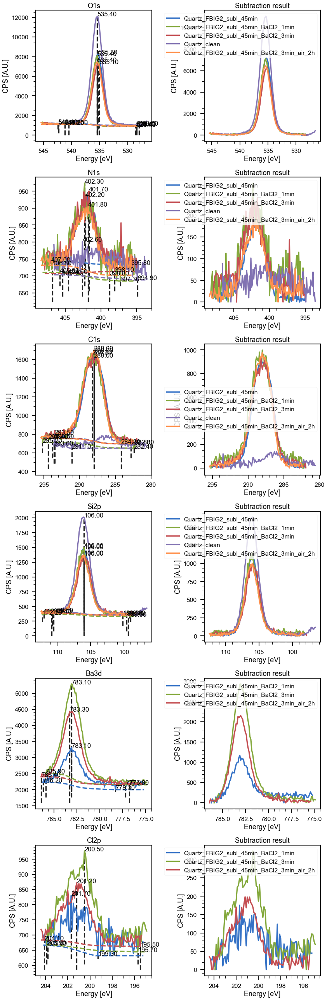

In [7]:
regions = ['O1s', 'N1s', 'C1s', 'Si2p', 'Ba3d', 'Cl2p']
bg = bulk_bg_subtract(experiments, regions)

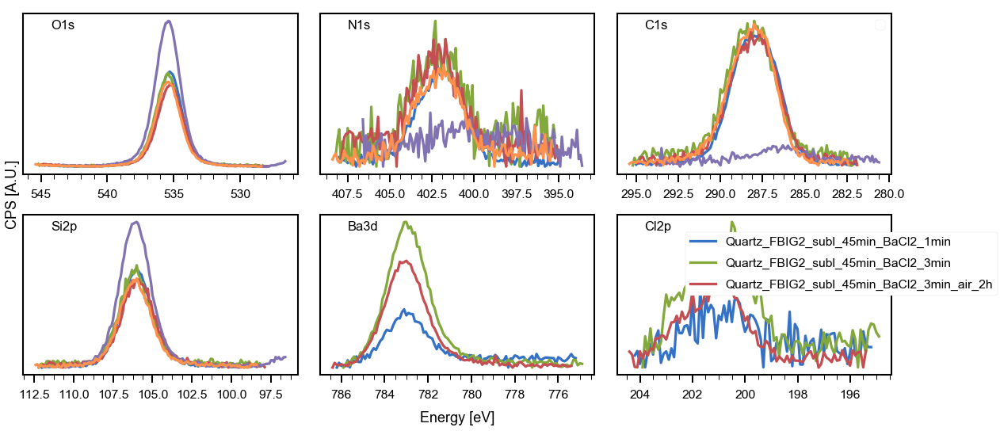

In [408]:
plot_xp_regions(bg, regions, ncols=3);

### Scale

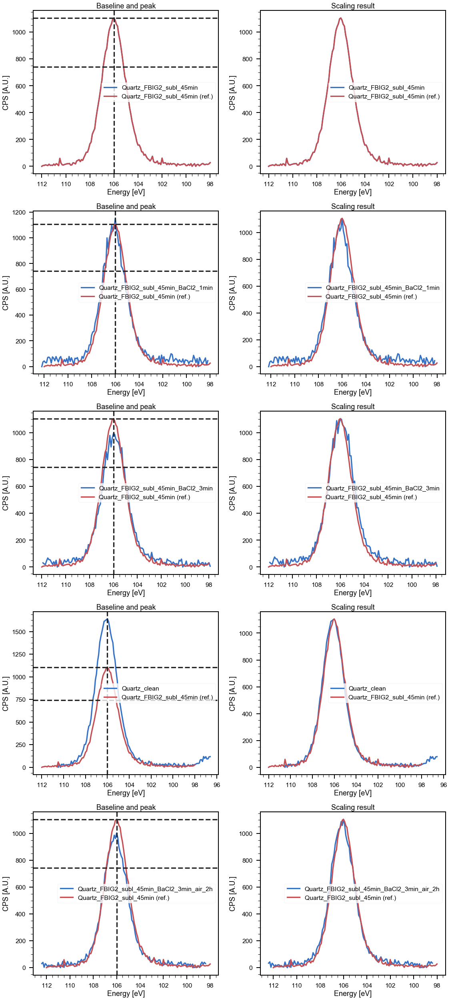

In [409]:
scaled = scale_and_plot_spectra(bg, indRef=0, region='Si2p')

In [122]:
def store_results(bg_exps: list, scaled_exps: list):

    for xpu, xps in zip(bg_exps, scaled_exps):
        filepath, filename = os.path.split(xpu.path)
        filename = os.path.splitext(filename)[0]
        newpath = filepath + '/proc/'
        try:
            os.mkdir(newpath)
        except FileExistsError: pass
        print('Stored ', newpath + filename)
        write_processed_xp(newpath + filename + '.uxy', xpu)
        write_processed_xp(newpath + filename + '.sxy', xps)


In [410]:
store_results(bg, scaled)

Stored  /Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/proc/20211222_Quartz_FBIG2_subl_45min
Stored  /Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/proc/20211222_Quartz_FBIG2_subl_45min_BaCl2_1min
Stored  /Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/proc/20211222_Quartz_FBIG2_subl_45min_BaCl2_3min
Stored  /Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/proc/20211222_Quartz_clean
Stored  /Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_22_quartz_1.4ML/proc/20211223_Quartz_FBIG2_subl_45min_BaCl2_3min_air_2h


# Import data G2

In [4]:
path = '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/'
files = glob.glob(path+'/**/**/*.uxy')
files.sort()
files

['/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_11_11_quartz/proc/20211111_Quartz clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_11_11_quartz/proc/20211111_quartz_FBIG2_subl_80min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_15_quartz_4ML/proc/20211215_Quartz_FBIG2_subl_040min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_15_quartz_4ML/proc/20211215_Quartz_FBIG2_subl_160min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_15_quartz_4ML/proc/20211215_Quartz_FBIG2_subl_325min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_15_quartz_4ML/proc/20211215_Quartz_FBIG2_subl_405min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_15_quartz_4ML/proc/20211215_Quartz_FBIG2_subl_445min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_15_quartz_4ML/proc/20211215_Quartz_clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_17_quartz_2M

In [396]:
unscaled = [read_processed_xp(f) for f in files]

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_11_11_quartz/proc/20211111_Quartz clean.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_11_11_quartz/proc/20211111_quartz_FBIG2_subl_80min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_15_quartz_4ML/proc/20211215_Quartz_FBIG2_subl_040min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_15_quartz_4ML/proc/20211215_Quartz_FBIG2_subl_160min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_15_quartz_4ML/proc/20211215_Quartz_FBIG2_subl_325min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/quartz_FBIG2/2021_12_15_q

In [397]:
[xp.name for xp in unscaled]

['Quartz clean',
 'quartz_FBIG2_subl_80min',
 'Quartz_FBIG2_subl_40min',
 'Quartz_FBIG2_subl_160min',
 'Quartz_FBIG2_subl_325min',
 'Quartz_FBIG2_subl_405min',
 'Quartz_FBIG2_subl_445min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_80min',
 'Quartz_clean3',
 'Quartz_FBIG2_subl_30min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_15min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_45min',
 'Quartz_FBIG2_subl_45min_BaCl2_1min',
 'Quartz_FBIG2_subl_45min_BaCl2_3min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_45min_BaCl2_3min_air_2h',
 'Quartz_FBIG2_subl_40min',
 'Quartz_FBIG2_subl_40min_BaCl2_10min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_160min',
 'Quartz_FBIG2_subl_160min_BaCl2_10min',
 'Quartz_clean']

In [414]:
xp.fit[reg].best_values['v1_center']

105.2925025619712

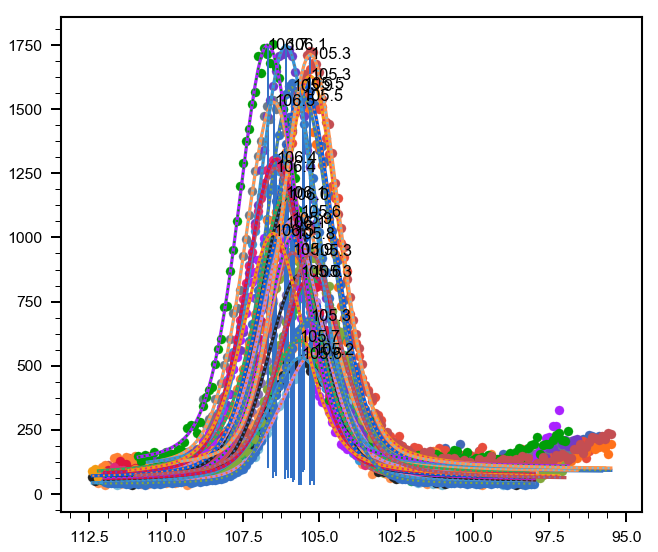

In [415]:
reg = 'Si2p'
for xp in unscaled:
    fn = XPFit(xp, 'Si2p')
    fn.voigt()
    fn.plot()
    center = xp.fit[reg].best_values['v1_center']
    shift = 107.3 - center
    align_dfx(xp, shift, inplace=True)


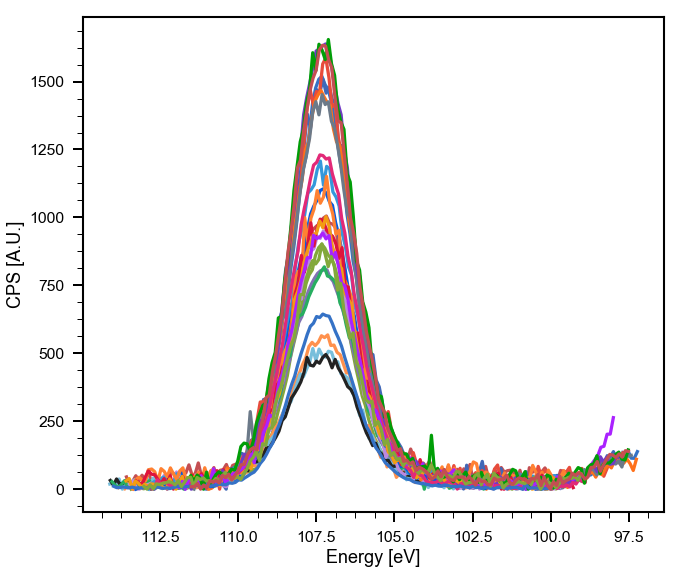

In [417]:
for xp in unscaled:
    plot_region(xp, reg)
plt.gca().get_legend().remove()    

## Plot regions

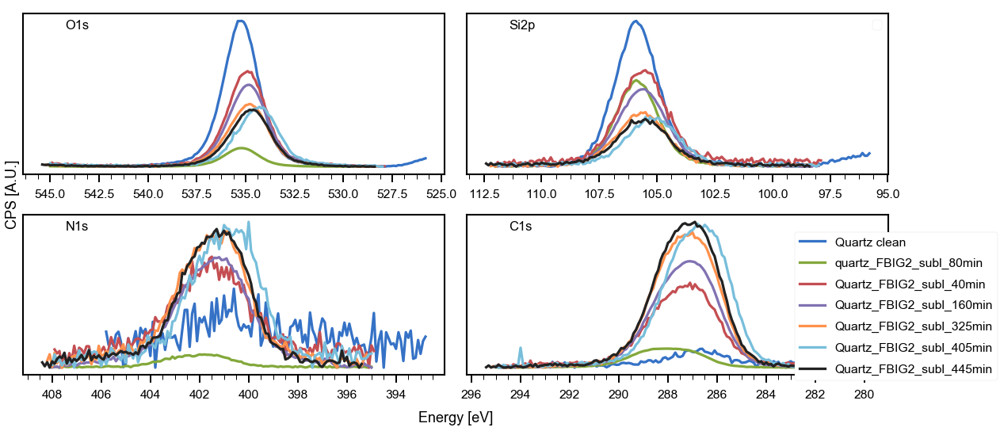

In [414]:
regs = [ 'O1s', 'Si2p',  'N1s', 'C1s']
plot_xp_regions(unscaled[:7], regs, ncols=2);

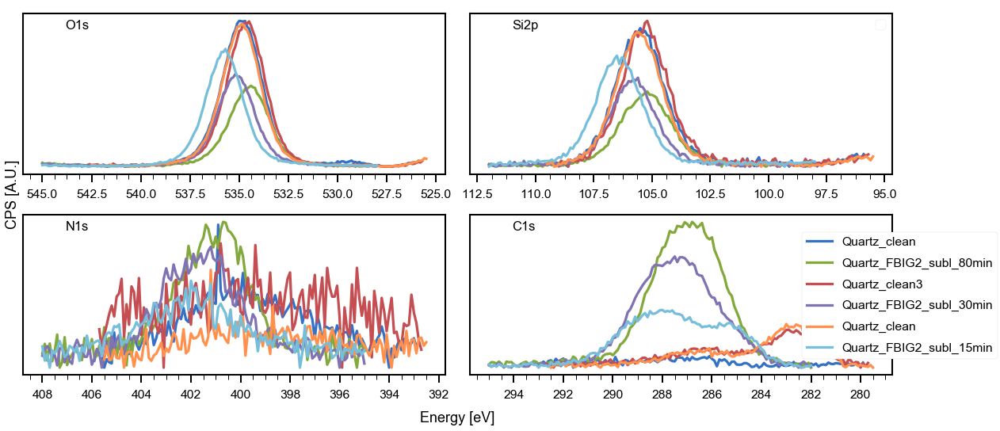

In [14]:
regs = [ 'O1s', 'Si2p',  'N1s', 'C1s']
plot_xp_regions(unscaled[7:13], regs, ncols=2);

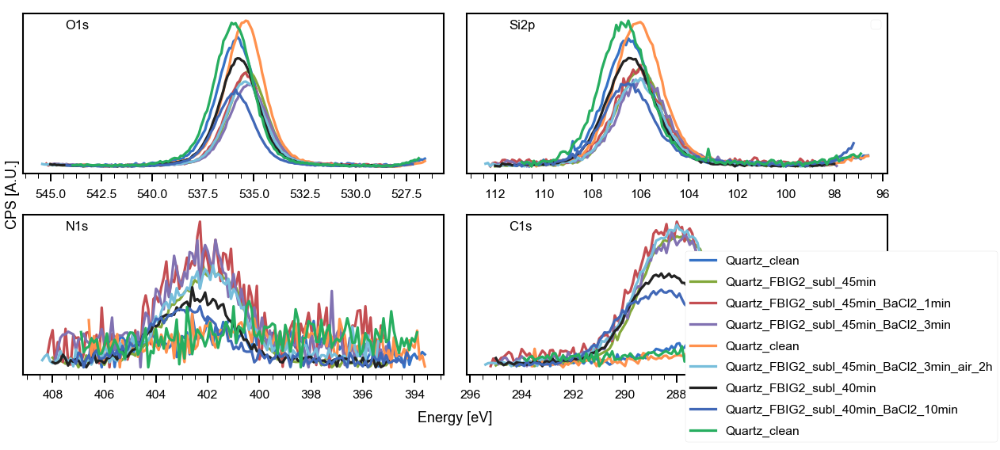

In [33]:
regs = [ 'O1s', 'Si2p',  'N1s', 'C1s']
plot_xp_regions(unscaled[13:], regs, ncols=2);

## Plot selection

In [531]:
sel = [deepcopy(unscaled[x]) for x in [6, 8, 10, 17]] # 12 is 0.4 ML
names = ['3.7ML', '2ML', '1.5ML',  'Quartz clean']
cols = ['b', 'g', 'r', 'k']
for xp, na, c in zip(sel, names, cols):
    xp.name = na
    xp.color = c
for xp in sel[1:]:
    shift = find_shift(xp, sel[0], 'Si2p')
    align_dfx(xp, shift, inplace=True)

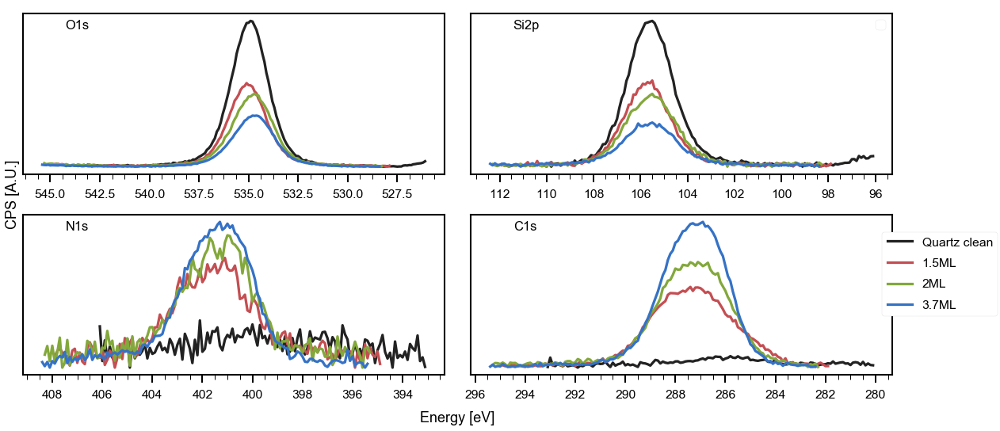

In [532]:
regs = [ 'O1s', 'Si2p',  'N1s', 'C1s']
plot_xp_regions(sel[::-1], regs, ncols=2);

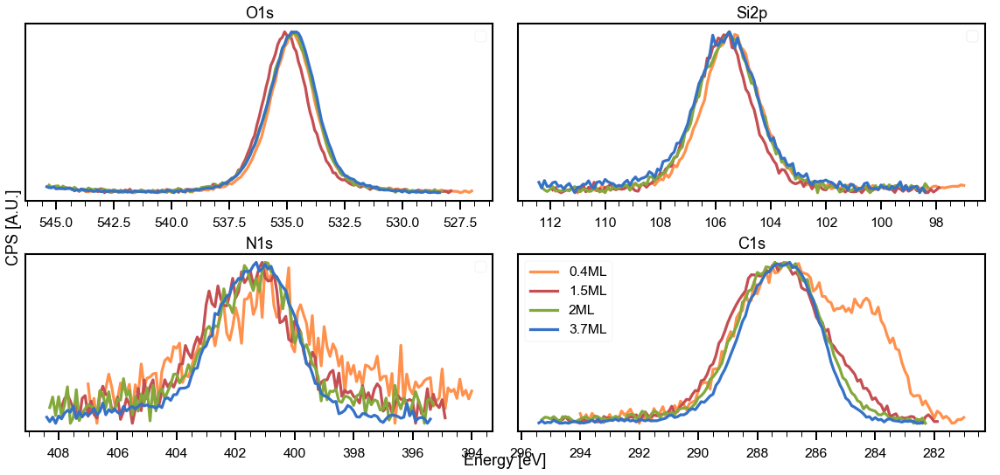

In [419]:
regs = [ 'O1s', 'Si2p',  'N1s', 'C1s']
plot_normal_regions(sel[3::-1], regs, ncols=2);

## Plot sel/Ba

In [421]:
selba = [deepcopy(unscaled[x]) for x in [14, 15, 16, 18]]
names = ['1.4ML', '1.4ML, $\\phi_{Ba}$ = 0.6', '1.4ML, $\\phi_{Ba}$ = 1.4', '1.4ML, $\\phi_{Ba}$ = 1.4, \n80ºC, 2h air exposure']
cols = ['r', 'g','m' ,'k']
for xp, na, c in zip(selba, names, cols):
    xp.name = na
    xp.color = c
# for xp in selba[1:]:
#     shift = find_shift(xp, selba[0], 'Si2p')
#     align_dfx(xp, shift, inplace=True)

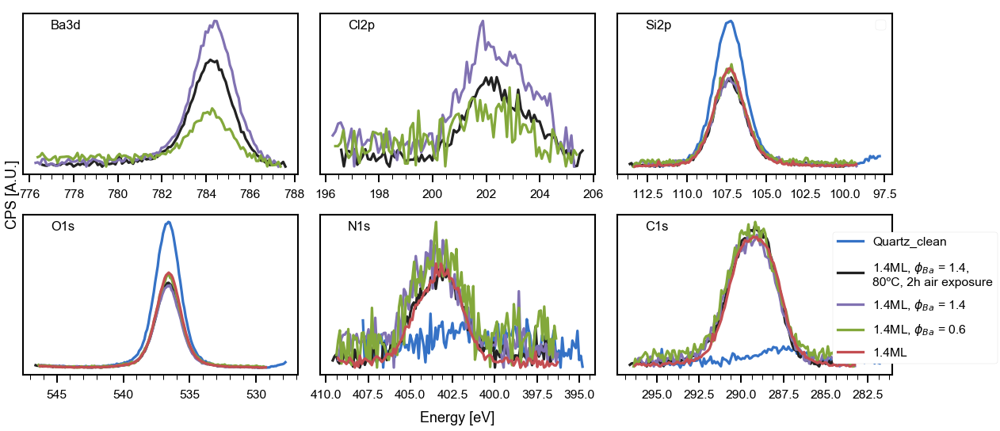

In [423]:
regs = ['Ba3d', 'Cl2p', 'Si2p', 'O1s', 'N1s', 'C1s']
ax = plot_xp_regions([unscaled[17]]+selba[::-1], regs, ncols=3);
ax[0,0].invert_xaxis()
ax[0,1].invert_xaxis()

In [420]:
[xp.name for xp in unscaled[13:]]

['Quartz_clean',
 'Quartz_FBIG2_subl_45min',
 'Quartz_FBIG2_subl_45min_BaCl2_1min',
 'Quartz_FBIG2_subl_45min_BaCl2_3min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_45min_BaCl2_3min_air_2h',
 'Quartz_FBIG2_subl_40min',
 'Quartz_FBIG2_subl_40min_BaCl2_10min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_160min',
 'Quartz_FBIG2_subl_160min_BaCl2_10min',
 'Quartz_clean']

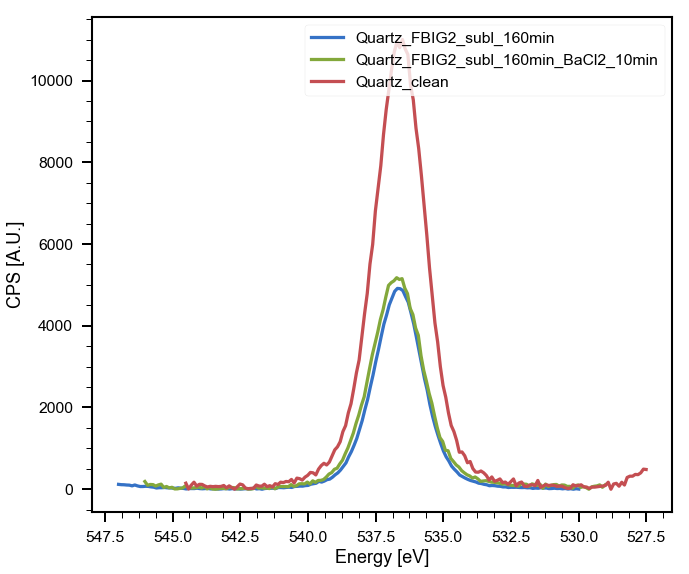

In [430]:
for xp in unscaled[22:]:
    plot_region(xp, 'O1s')

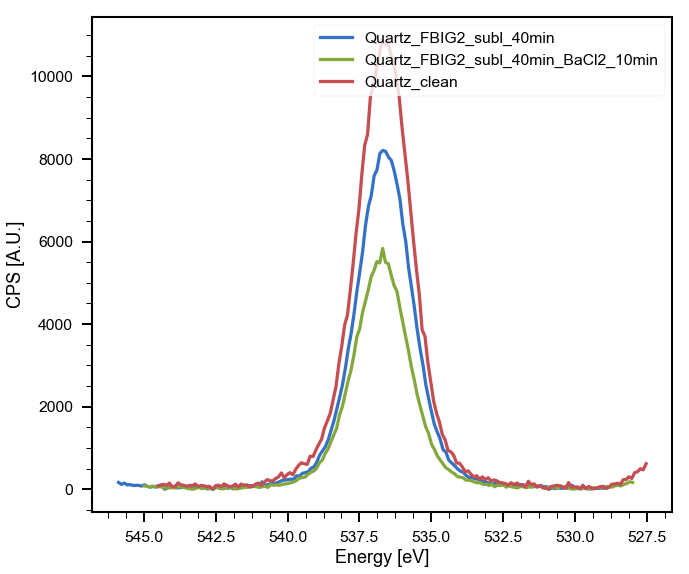

In [431]:
for xp in unscaled[19:22]:
    plot_region(xp, 'O1s')

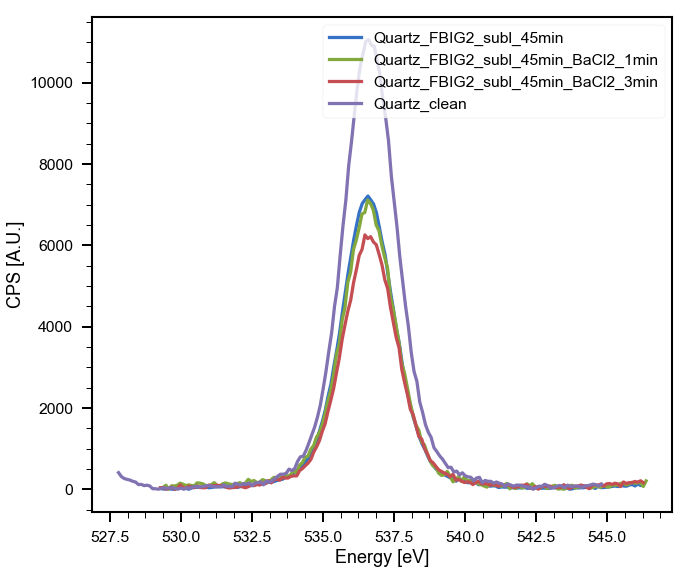

In [433]:
for xp in unscaled[14:18]:
    plot_region(xp, 'O1s')

# Stoichiometry

'Ba3d' region does not exist in Quartz clean
'Ba3d' region does not exist in Quartz_FBIG2_subl_40min
'Ba3d' region does not exist in Quartz_FBIG2_subl_160min
'Ba3d' region does not exist in Quartz_FBIG2_subl_405min
'Ba3d' region does not exist in Quartz_clean
'Ba3d' region does not exist in Quartz_FBIG2_subl_80min
'Ba3d' region does not exist in Quartz_clean3
'Ba3d' region does not exist in Quartz_FBIG2_subl_30min
'Ba3d' region does not exist in Quartz_clean
'Ba3d' region does not exist in Quartz_FBIG2_subl_15min
'Ba3d' region does not exist in Quartz_clean
'Ba3d' region does not exist in Quartz_FBIG2_subl_45min
'Ba3d' region does not exist in Quartz_clean
'Ba3d' region does not exist in Quartz_clean
'Cl2p' region does not exist in Quartz clean
'Cl2p' , asf missing, returning raw area
'Cl2p' region does not exist in Quartz_FBIG2_subl_40min
'Cl2p' , asf missing, returning raw area
'Cl2p' , asf missing, returning raw area
'Cl2p' region does not exist in Quartz_FBIG2_subl_405min
'Cl2p' , 

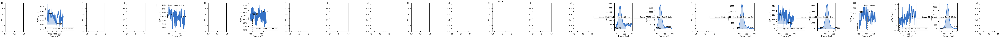

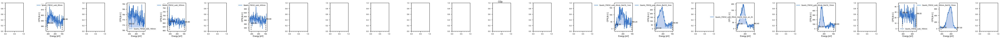

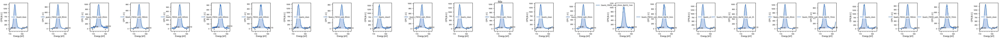

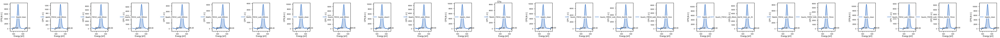

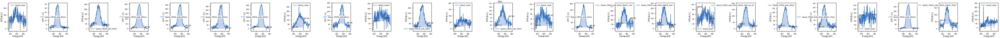

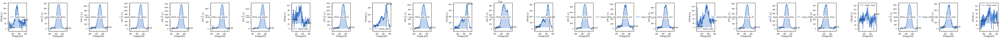

In [108]:
for r in regs:
    integrateRegions(unscaled, r, asf=asf)

'Ba3d' region does not exist in Quartz_FBIG2_subl_40min
'Ba3d' region does not exist in Quartz_FBIG2_subl_160min
'Ba3d' region does not exist in Quartz_FBIG2_subl_405min
'Ba3d' region does not exist in Quartz_clean
'Ba3d' region does not exist in Quartz_FBIG2_subl_80min
'Ba3d' region does not exist in Quartz_clean3
'Ba3d' region does not exist in Quartz_FBIG2_subl_30min
'Ba3d' region does not exist in Quartz_clean
'Ba3d' region does not exist in Quartz_FBIG2_subl_15min
'Ba3d' region does not exist in Quartz_clean
'Ba3d' region does not exist in Quartz_FBIG2_subl_45min
'Ba3d' region does not exist in Quartz_clean
'Ba3d' region does not exist in Quartz_clean


[10249.83437500233,
 17958.687495004076,
 16559.875030003765,
 3286.0228401776726,
 7269.48618313337,
 5400.651274034583,
 1064.6374885052323,
 19948.7470807711,
 705.7265424969667,
 212.69094629360887,
 17375.099575298904]

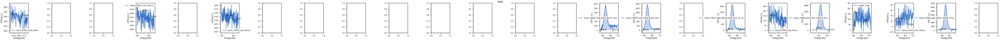

In [109]:
integrateRegions(unscaled[1:], 'Ba3d', indRef=14, asf=asf)

In [ ]:
[xp.name for xp in unscaled]

In [110]:
ag2sto = {'C1s': 31, 'O1s':5, 'N1s':3}
g2sto = XPS_experiment(name='Stoichiometry FBI-G2', area=ag2sto)

g2 = [deepcopy(unscaled[i]) for i in [1, 2, 3, 4, 5, 6, 8, 10, 12, 14, 22]]
g2ba = [unscaled[j] for j in [15, 16, 20, 23]]
# g2[0].area['N1s'] -= unscaled[0].area['N1s']
# g2[0].area['C1s'] -= unscaled[0].area['C1s']

for xp in g2[1:7]:
    xp.area['N1s'] -= unscaled[7].area['N1s']
#     xp.area['O1s'] -= unscaled[5].area['O1s']

for xp in g2ba:
    xp.area['FBI-G2'] = xp.area['N1s']/3

num = ['C1s', 'C1s', 'O1s'] 
denom = ['O1s', 'N1s', 'N1s']
display_stoichiometry(g2 + [g2sto], num, denom)
display_stoichiometry(g2ba, num + ['Ba3d'], denom + ['FBI-G2'])

# Coverage

In [132]:
unscaled[2].name 

'Quartz_FBIG2_subl_40min'

In [425]:
[xp.name for xp in unscaled]

['Quartz clean',
 'quartz_FBIG2_subl_80min',
 'Quartz_FBIG2_subl_40min',
 'Quartz_FBIG2_subl_160min',
 'Quartz_FBIG2_subl_325min',
 'Quartz_FBIG2_subl_405min',
 'Quartz_FBIG2_subl_445min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_80min',
 'Quartz_clean3',
 'Quartz_FBIG2_subl_30min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_15min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_45min',
 'Quartz_FBIG2_subl_45min_BaCl2_1min',
 'Quartz_FBIG2_subl_45min_BaCl2_3min',
 'Quartz_clean',
 'Quartz_FBIG2_subl_45min_BaCl2_3min_air_2h']

In [111]:
inds = [[1, 0], [2, 3, 4, 5, 6, 7], [8, 9], [10,11], [12, 13], [14, 17]]
arrange_coverages(unscaled, inds, r_ml=1.1,
                  region='Si2p', mfp=3.8, takeoff=10)

matrix([[1.77834214, 0.05325197],
        [1.00522639, 0.04744667],
        [2.0848742 , 0.05228038],
        [3.13777243, 0.05810558],
        [3.27755639, 0.05897105],
        [3.33129752, 0.05930988],
        [1.9414453 , 0.05150557],
        [1.45306643, 0.05088953],
        [0.58282417, 0.00807886],
        [1.38091822, 0.04794413]])

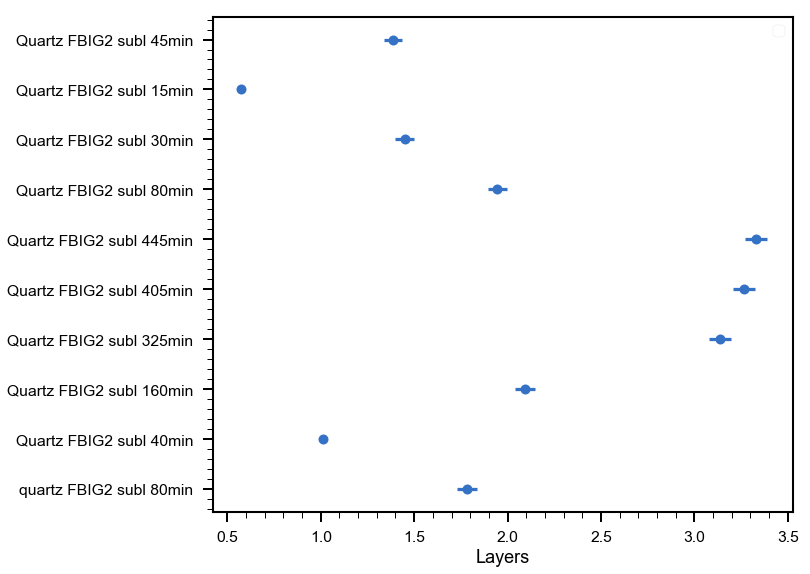

In [427]:
plot_coverages(unscaled)

80
40
160
325
405
445
80
30
15
45


[Text(0, 0.5, 'layers [ML]'), Text(0.5, 0, 'Exposure time [min]')]

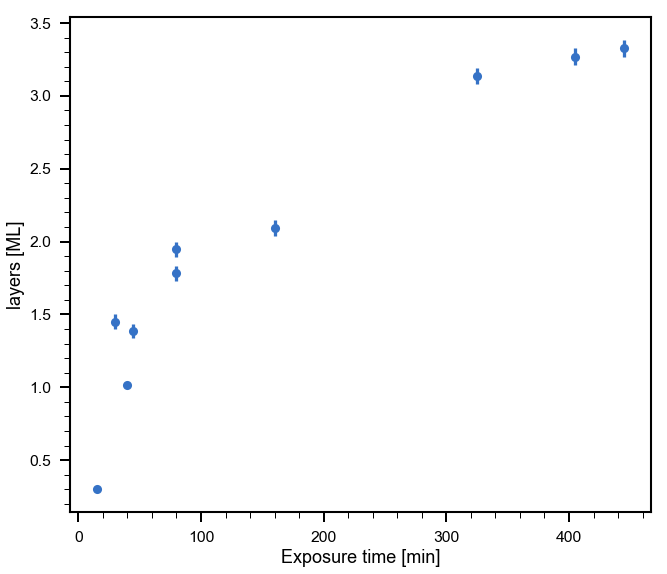

In [218]:
texp, layers = [], []
dlayers = []
for xp in unscaled[:15]:
    if 'clean' not in xp.name:
        t = xp.name.replace('Quartz_FBIG2_subl_', '').replace('min', '').replace('quartz_FBIG2_subl_', '')
        texp.append(int(t))
        print(t)
        layers.append(xp.area['layers'])
        dlayers.append(xp.area['dlayers'])
    
plt.errorbar(texp, layers, yerr=dlayers, fmt='o')
plt.gca().set(ylabel='layers [ML]', xlabel='Exposure time [min]')

In [78]:
layers[:][0]

(1.7932981940248642, 0.053368763545555815)

In [112]:
store_results(unscaled, scaled)

NameError: name 'store_results' is not defined

# Estimate Ba/FBIG2 ratio from QMB data

In [47]:
from qmb.qmb_sw import *
pd.plotting.register_matplotlib_converters()

In [55]:
def plotFreqThick(dfq):
    fig, ax = plt.subplots(figsize=(10,8))
    ax.plot(dfq.timestamp, dfq.frequency)
    ax.set_ylabel('f [Hz]')
    ax2 = plt.twinx(ax)
    ax2.plot(dfq.timestamp, dfq.film_thickness, '-r')
    ax2.set_ylabel('Film Thickness [Å]')
    # plt.xticks(rotation=46);
    fig.autofmt_xdate()

In [62]:
def chopTime(dfq: pd.DataFrame, tStart: datetime.time, tEnd: datetime.time= None):
    t1 = dfq.timestamp
    t1 = t1.apply(lambda x: x.time())
    if tEnd != None:
        film1 = dfq.film_thickness.where(t1 < tEnd).dropna()
        freq1 = dfq.frequency.where(t1 < tEnd).dropna()
        t1 = t1.where(t1 < tEnd).dropna()        
    else:
        film1 = dfq.film_thickness.where(t1 < t1.iloc[-1]).dropna()
        freq1 = dfq.frequency.where(t1 < t1.iloc[-1]).dropna()
        t1 = t1.where(t1 < t1.iloc[-1]).dropna()

    t2 = t1.where(t1.values > tStart).dropna()
    film2 = film1.where(t1.values > tStart).dropna()
    freq2 = freq1.where(t1.values > tStart).dropna()
    
    dfqChop = pd.DataFrame([t2, film2, freq2]).T
    dfqChop.reset_index(drop=False, inplace=True)
    return dfqChop

In [159]:
def getFreqRate(dfq: pd.DataFrame, flag_plot:bool = True):
    t2 = dfq.timestamp.dropna()
    freq2 = dfq.frequency.dropna()
    tend = t2.iloc[np.argmin(freq2)]
    freqend = freq2.iloc[np.argmin(freq2)]
    tstart = t2.iloc[np.argmax(freq2)]
    freqstart = freq2.iloc[np.argmax(freq2)]
    
    tdelta = datetime.datetime(2021, 5, 10, tend.hour, tend.minute, 
                               tend.second) -  datetime.datetime(2021, 5, 10, tstart.hour,
                                                                 tstart.minute, tstart.second)
    freqRate = (freqend - freqstart ) / tdelta.seconds
    
    if flag_plot:
        fig, ax = plt.subplots(figsize=(10,8))
        ax.plot(t2, freq2, '-g')

        ax.set_ylabel('Frequency [Hz]')
        ax.tick_params(axis='y', labelcolor='k')

        ax.plot(tstart, freqstart, 'or', markersize=12)
        ax.plot(tend, freqend, 'or', markersize=12)
        ax.arrow(x = tend, y=freqstart, dx = 0, dy = freqend - freqstart)

        fig.autofmt_xdate()
        ax.annotate('', xy=(tend, freqstart), xytext=(tend, freqend), arrowprops=dict(arrowstyle='<->'))
        plt.show()
        
    return freqRate, tdelta

## Ref rate: run 42 (uncentered sensor)

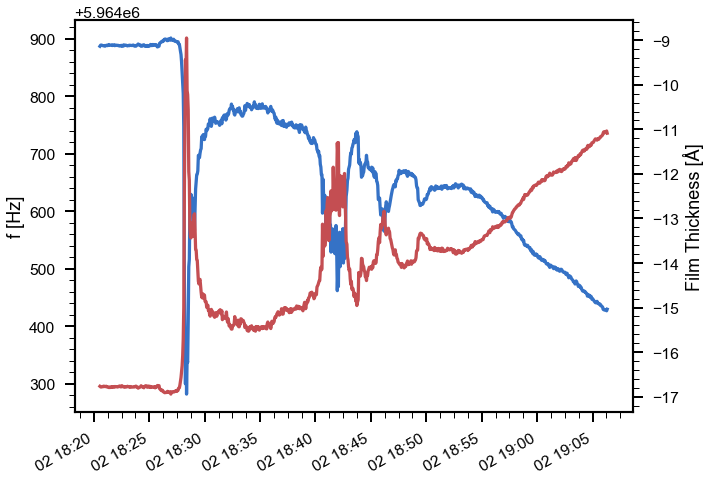

In [161]:
data = '/Users/pabloherrero/sabat/qmc_data/BaCl2_evap/RUN#00042.txt'
dfq = import_qmb_data(data)
plotFreqThick(dfq)

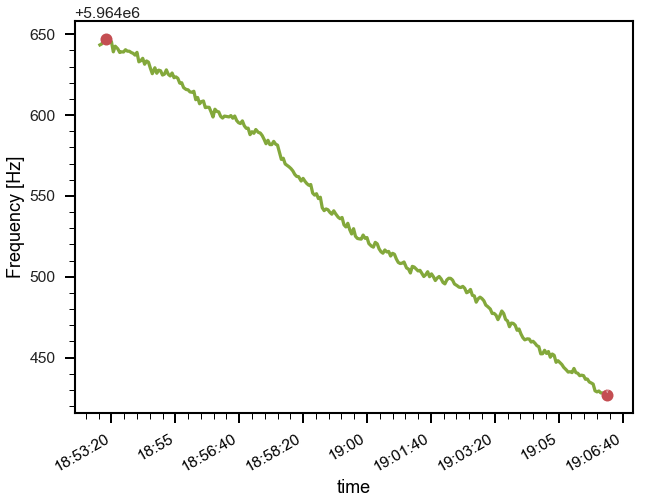

(-0.28068789808898215, datetime.timedelta(seconds=785))

In [162]:
dfqChop = chopTime(dfq, tStart=datetime.time(18, 53))

rateRef, tdelta = getFreqRate(dfqChop)
rateRef, tdelta

## Ref rate: run 43
File: E:\DataXPS_UPS\Pablo\2021_10_15_Au_mica\20211015_AuMica_FBIG3_subl_15min_BaCl2_1min.sle

1 min deposition

$\phi = 1.19$

Coverage (FBI-G3) = 1.43 ML

Absolute Area Ba3d 5/2/ASF (Ba) = 329

In [174]:
area_ba1min = 329.657

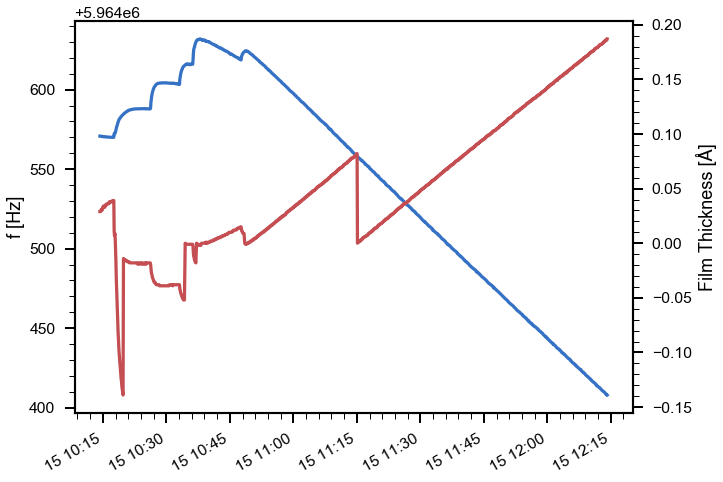

In [169]:
data = '/Users/pabloherrero/sabat/qmc_data/BaCl2_evap/RUN#00043.txt'
dfq = import_qmb_data(data)
plotFreqThick(dfq)

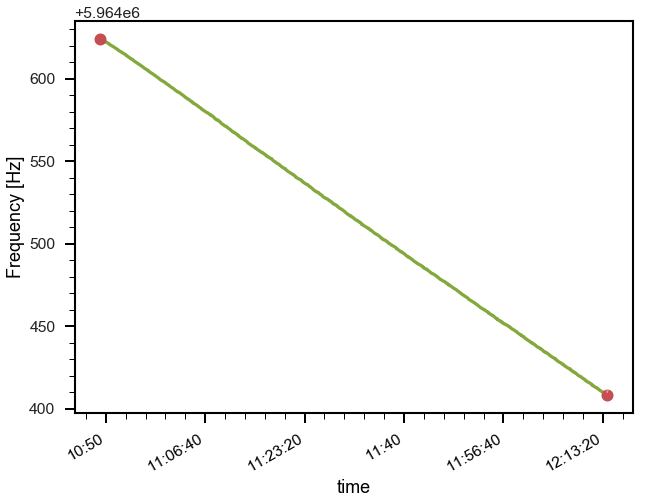

(-0.04233000195958779, datetime.timedelta(seconds=5103))

In [170]:
dfqChop = chopTime(dfq, tStart=datetime.time(10, 49),)

rateRef1, tdelta1 = getFreqRate(dfqChop)
rateRef1, tdelta1

## Rate blind deposition: run 44
Over FBI-G2, 1.79 ML

4 min evaporation, same rate

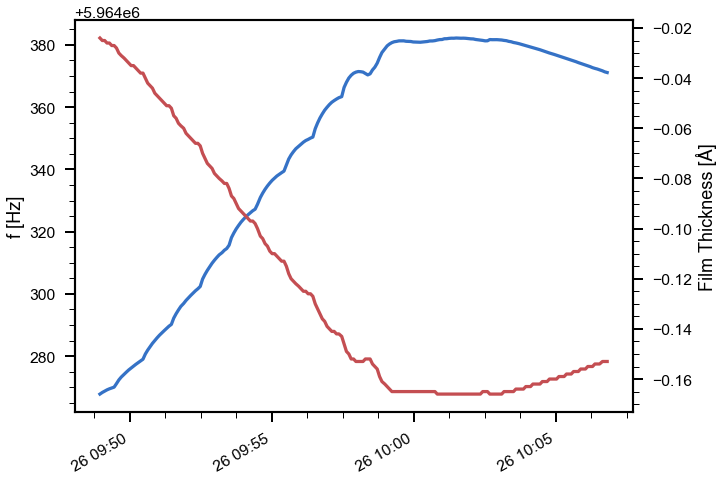

In [165]:
data = '/Users/pabloherrero/sabat/qmc_data/BaCl2_evap/RUN#00044.txt'
dfq = import_qmb_data(data)
plotFreqThick(dfq)

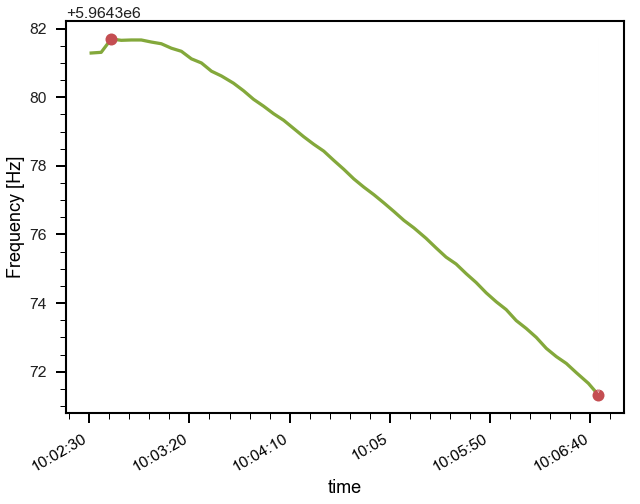

(-0.042716049382256135, datetime.timedelta(seconds=243))

In [168]:
dfqChop = chopTime(dfq, tStart=datetime.time(10, 2, 30),)

rate44, tdelta44 = getFreqRate(dfqChop)
rate44, tdelta44

In [176]:
area_ba4min = 4 * area_ba1min
area_ba4min

1318.628

In [194]:
phiG3_1min = 1.2
covG3_15min = 1.43 # ML
covG2_80min = 1.79 # ML
phiG2_80min = 4 * phiG3_1min *covG3_15min / covG2_80min 
phiG2_80min

3.83463687150838

## Rate blind deposition: run 45

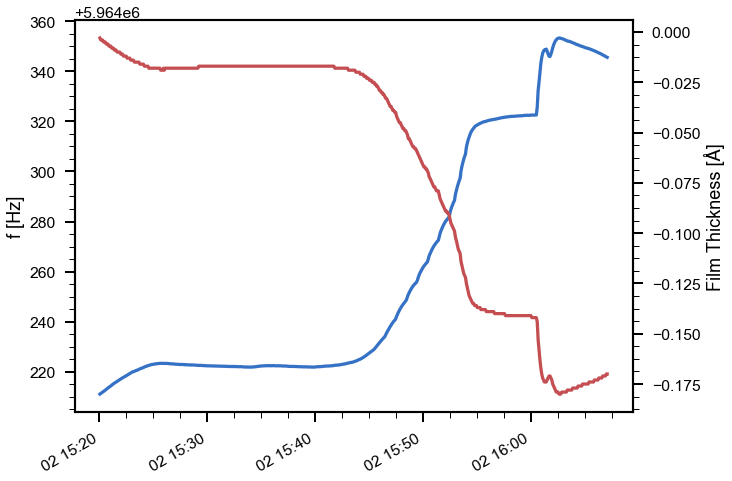

In [182]:
data = '/Users/pabloherrero/sabat/qmc_data/BaCl2_evap/RUN#00045.txt'
dfq = import_qmb_data(data)
plotFreqThick(dfq)

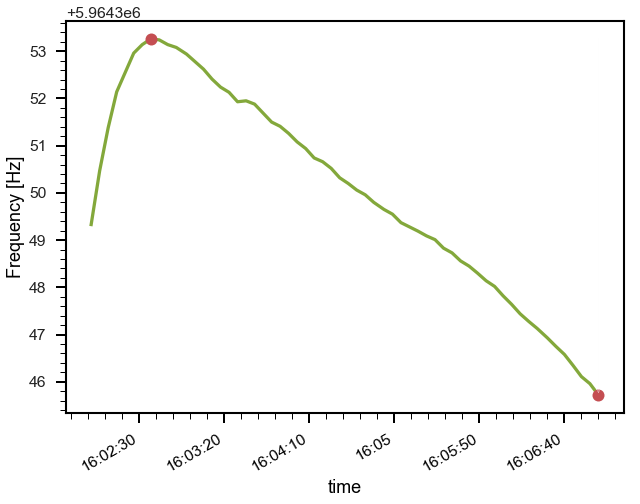

(-0.028669201521054195, datetime.timedelta(seconds=263))

In [188]:
dfqChop = chopTime(dfq, tStart=datetime.time(16, 2, 0),)

rate45, tdelta45 = getFreqRate(dfqChop)
rate45, tdelta45

In [189]:
rate45 - rate44

0.01404684786120194

In [200]:
rate45 / rate44

0.6711576078700556

In [198]:
covG2_40min

0.895

In [201]:
phiG3_1min = 1.2
covG3_15min = 1.43 # ML
covG2_40min = covG2_80min / 2
phiG2_40min = 4 * phiG3_1min * rate45/rate44  * covG3_15min / covG2_40min 
phiG2_40min, phiG2_80min * 2

(5.147291419463755, 7.66927374301676)

# Spectrometry

In [27]:
file = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_3,7capas vs 2capas_12.txt'
df = pd.read_csv(file, skiprows=25, names=[ '4ML', '2ML', 'no'])
df.drop('no', axis=1, inplace=True)

file2 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,5capas_12.txt'
df2 = pd.read_csv(file2, skiprows=25, names=[ '1.5ML', 'no'])
df2.drop('no', axis=1, inplace=True)
df['1.5ML'] = df2['1.5ML']

file6 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_0,4capas_12_rep.txt'
df6 = pd.read_csv(file6, skiprows=25, names=['0.4 ML (rep)', 'no'])
df6.drop('no', axis=1, inplace=True)
df['0.4 ML (rep)'] = df6['0.4 ML (rep)']

file3 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_0,4capas_12.txt'
df3 = pd.read_csv(file3, skiprows=25, names=[ '0.4ML', 'no'])
df3.drop('no', axis=1, inplace=True)
df['0.4ML'] = df3['0.4ML']

file4 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,5capas_Ba_12.txt'
df4 = pd.read_csv(file4, skiprows=25, names=['1.4ML Ba++', 'no'])
df4.drop('no', axis=1, inplace=True)
df['1.4ML Ba++'] = df4['1.4ML Ba++']


file10 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,5capas_Ba_calentado_80_12.csv'
df10 = pd.read_csv(file10, skiprows=21, names=['1.4ML Ba++ 80ºC', 'no'])
df10.drop('no', axis=1, inplace=True)
df['1.4ML Ba++ 80ºC'] = df10['1.4ML Ba++ 80ºC']

file5 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/Porta de Molibdeno.txt'
df5 = pd.read_csv(file5, skiprows=25, names=['Sample holder', 'no'])
df5.drop('no', axis=1, inplace=True)
df['Sample holder'] = df5['Sample holder']

file11 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,0capas_9Ba_12.txt'
df11 = pd.read_csv(file11, skiprows=21, names=['1.0ML:9Ba++', 'no'])
df11.drop('no', axis=1, inplace=True)
df['1.0ML:9Ba++'] = df11['1.0ML:9Ba++']

file12 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_3,0capas_8Ba_12.txt'
df12 = pd.read_csv(file11, skiprows=21, names=['3.0ML:5Ba++', 'no'])
df12.drop('no', axis=1, inplace=True)
df['3.0ML:5Ba++'] = df12['3.0ML:5Ba++']

In [28]:
file7 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,6capas_ITO_12.txt'
dfIto = pd.read_csv(file7, skiprows=23, names=['1.6 ML (ITO)', 'no'])
dfIto.drop('no', axis=1, inplace=True)
# dfIto['1.6 ML (ITO)'] = dfIto['1.6 ML (ITO)']
dfIto

file8 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,6capas_ITO_10scans_12.txt'
dfIto2 = pd.read_csv(file8, skiprows=23, names=['1.6 ML (ITO, 10 scans)', 'no'])
dfIto2.drop('no', axis=1, inplace=True)
dfIto['1.6 ML (ITO)'] = dfIto2['1.6 ML (ITO, 10 scans)']/10

file13 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,0capas_3Ba_ITO_PTES_2.txt'
dfIto3 = pd.read_csv(file13, skiprows=23, names=['1ML (PTES/ITO)', 'no'])
dfIto3.drop('no', axis=1, inplace=True)
dfIto['1ML (PTES/ITO)'] = dfIto3['1ML (PTES/ITO)']


file9 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1e-5M_1eq_Ba++_AcN.csv'
dfsol = pd.read_csv(file9, sep=';', index_col=0, skiprows=1, names=['λ (nm)', 'G2 1e-5M', 'G2 1e-5M Ba 1eq'])

[Text(0, 0.5, 'Counts (A.U.)'), Text(0.5, 0, 'Wavelength (nm)')]

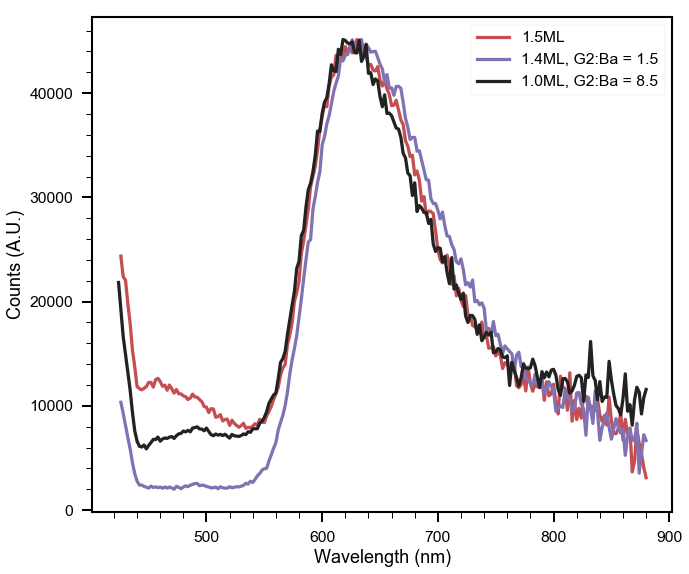

In [265]:
normfactor = df['1.5ML'].max() / dfsol['G2 1e-5M'].max()
normfactorba = df['1.4ML Ba++'].max() / dfsol['G2 1e-5M Ba 1eq'].max()
# df['4ML'].plot(color='b')
# (normfactor * dfsol['G2 1e-5M']).plot(color='r', linestyle='--', label='Solution 1e-5M')

# dfsol['G2 1e-5M'].plot(color='r', linestyle='--', label='Solution 1e-5M')
# dfsol['G2 1e-5M Ba 1eq'].plot(color='m', linestyle='--')

# df['4ML'].plot(color='b')
# df['2ML'].iloc[1:].plot(color='g')
normfactorba = df['1.4ML Ba++'].max() / df['1.5ML'].max()
(normfactorba * df['1.5ML'].iloc[:-10]).plot(color='r')

# df['1.5ML'].iloc[:-10].plot(color='r')
df['1.4ML Ba++'].iloc[:-10].plot(color='m', label='1.4ML, G2:Ba = 1.5')

normfactorba = df['1.4ML Ba++'].max() / df['1.0ML:9Ba++'].iloc[1:].max()
(normfactorba * df['1.0ML:9Ba++'].iloc[1:-10]).plot(color='k', label='1.0ML, G2:Ba = 8.5')

# df['1.4ML Ba++ 80ºC'].plot(color='k')

# df['0.4ML'].plot(color='y')
# df['0.4 ML (rep)'].plot(color='y', linestyle='--')
# df['Sample holder'].plot(color='k')

# dfIto['1.6 ML (ITO)'].plot(color='c')

plt.legend()
# plt.yscale('log')
plt.gca().set(xlabel='Wavelength (nm)', ylabel='Counts (A.U.)')

In [271]:
dfIto

,1.6 ML (ITO),1ML (PTES/ITO)
422.0,36225.10940,27930.65430
424.0,13058.86950,9398.38281
426.0,11411.05230,8942.29297
428.0,10122.25940,8353.94141
430.0,8860.60781,7463.56982
...,...,...
892.0,3357.00703,1221.47473
894.0,5264.30391,4259.95410
896.0,6033.30039,-3305.62549
898.0,1735.52754,4824.19971


[Text(0, 0.5, 'Counts (A.U.)'), Text(0.5, 0, 'Wavelength (nm)')]

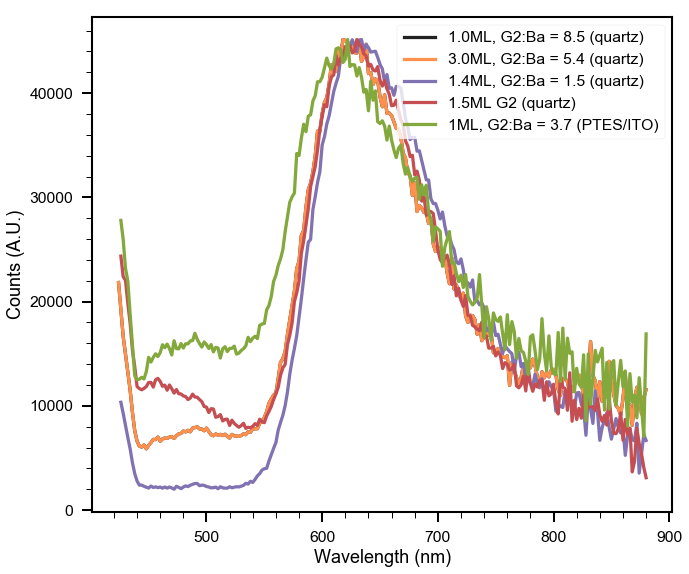

In [270]:
# normfactor = df['1.5ML'].max() / dfsol['G2 1e-5M'].max()
# normfactorba = df['1.4ML Ba++'].max() / dfsol['G2 1e-5M Ba 1eq'].max()
# df['4ML'].plot(color='b')
# (normfactor * dfsol['G2 1e-5M']).plot(color='r', linestyle='--', label='Solution 1e-5M')

# dfsol['G2 1e-5M'].plot(color='r', linestyle='--', label='Solution 1e-5M')
# dfsol['G2 1e-5M Ba 1eq'].plot(color='m', linestyle='--')

# df['4ML'].plot(color='b')
# df['2ML'].iloc[1:].plot(color='g')
normfactorba = df['1.4ML Ba++'].max() / df['1.0ML:9Ba++'].iloc[1:].max()
(normfactorba * df['1.0ML:9Ba++'].iloc[1:-10]).plot(color='k', label='1.0ML, G2:Ba = 8.5 (quartz)')

normfactorba = df['1.4ML Ba++'].max() / df['3.0ML:5Ba++'].iloc[2:].max()
(normfactorba * df['3.0ML:5Ba++'].iloc[1:-10]).plot(color='y', label='3.0ML, G2:Ba = 5.4 (quartz)')
# df['3.0ML:5Ba++'].iloc[1:-10].plot(color='y', label='3.0ML, G2:Ba = 5.4')

# df['1.5ML'].iloc[:-10].plot(color='r')

df['1.4ML Ba++'].iloc[:-10].plot(color='m', label='1.4ML, G2:Ba = 1.5 (quartz)')
normfactorba = df['1.4ML Ba++'].max() / df['1.5ML'].max()
(normfactorba * df['1.5ML'].iloc[:-10]).plot(color='r', label='1.5ML G2 (quartz)')

normfactorba = df['1.4ML Ba++'].max() / dfIto['1ML (PTES/ITO)'].iloc[2:].max()
(normfactorba * dfIto['1ML (PTES/ITO)'].iloc[2:-10]).plot(color='g', label='1ML, G2:Ba = 3.7 (PTES/ITO)')


# df['1.0ML:9Ba++'].iloc[1:-10].plot(color='k', label='1.0ML, G2:Ba = 8.5')
# df['1.5ML'].iloc[:-10].plot(color='r')

# df['1.4ML Ba++ 80ºC'].plot(color='k')

# df['0.4ML'].plot(color='y')
# df['0.4 ML (rep)'].plot(color='y', linestyle='--')
# df['Sample holder'].plot(color='k')

# dfIto['1.6 ML (ITO)'].plot(color='c')

plt.legend()
# plt.yscale('log')
plt.gca().set(xlabel='Wavelength (nm)', ylabel='Counts (A.U.)')

In [339]:
dfsol['G2 1e-5M'].idxmax(), df['1.5ML'][500:].idxmax(), dfsol['G2 1e-5M'].idxmax() -df['1.5ML'][500:].idxmax()

(606.0, 630.0, -24.0)

In [476]:
totMLBa = df['1.4ML Ba++'][540:800].sum()
totML = df['1.5ML'][540:800].sum()

totMLBa / totML

1.504888418098026

In [344]:
totsol = dfsol['G2 1e-5M'][540:800].sum()
totML = df['1.5ML'][540:800].sum()

totML / totsol

1.4528112702824882

## on ITO

In [275]:
dfIto

,1.6 ML (ITO),1ML (PTES/ITO)
422.0,36225.10940,27930.65430
424.0,13058.86950,9398.38281
426.0,11411.05230,8942.29297
428.0,10122.25940,8353.94141
430.0,8860.60781,7463.56982
...,...,...
892.0,3357.00703,1221.47473
894.0,5264.30391,4259.95410
896.0,6033.30039,-3305.62549
898.0,1735.52754,4824.19971


[Text(0, 0.5, 'Counts (A.U.)'), Text(0.5, 0, 'Wavelength (nm)')]

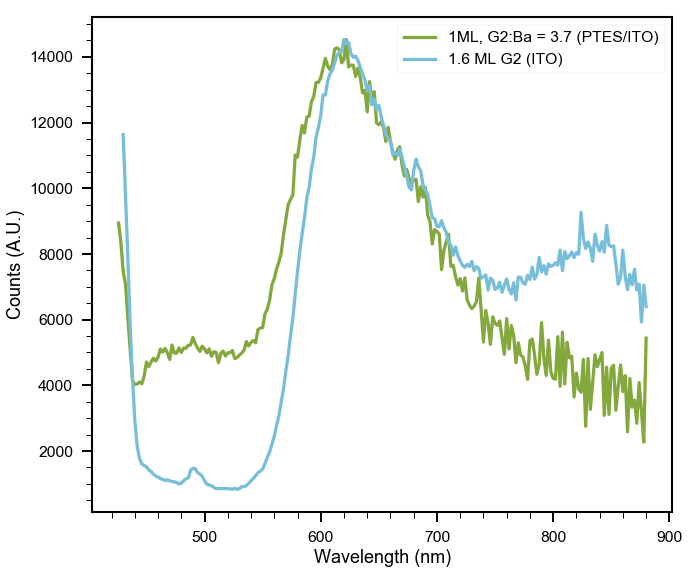

In [285]:
# df['4ML'].plot(color='b')
# df['2ML'].plot(color='g')
# df['1.5ML'].plot(color='r')
# df['1.4ML Ba++'].plot(color='m')
# df['0.4ML'].plot(color='y')
# df['0.4 ML (rep)'].plot(color='y', linestyle='--')
# df['Sample holder'].plot(color='k')

dfIto['1ML (PTES/ITO)'].iloc[2:-10].plot(color='g', label='1ML, G2:Ba = 3.7 (PTES/ITO)')
normfactorba =  dfIto['1ML (PTES/ITO)'].iloc[2:].max() / dfIto['1.6 ML (ITO)'].iloc[4:].max()
(normfactorba * dfIto['1.6 ML (ITO)'].iloc[4:-10]).plot(color='c', label='1.6 ML G2 (ITO)')

plt.legend()
plt.gca().set(xlabel='Wavelength (nm)', ylabel='Counts (A.U.)')

[Text(0.5, 0, 'Wavelength (nm)')]

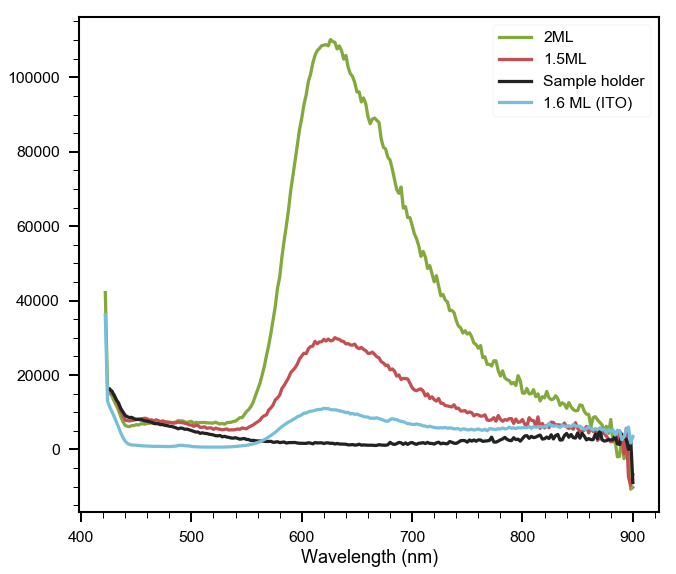

In [555]:
# df['4ML'].plot(color='b')
df['2ML'].plot(color='g')
df['1.5ML'].plot(color='r')
# df['1.4ML Ba++'].plot(color='m')
# df['0.4ML'].plot(color='y')
# df['0.4 ML (rep)'].plot(color='y', linestyle='--')
df['Sample holder'].plot(color='k')
dfIto['1.6 ML (ITO)'].plot(color='c')

plt.legend()
# plt.yscale('log')
plt.gca().set(xlabel='Wavelength (nm)')

[Text(0, 0.5, 'Counts (A.U.)'), Text(0.5, 0, 'Wavelength (nm)')]

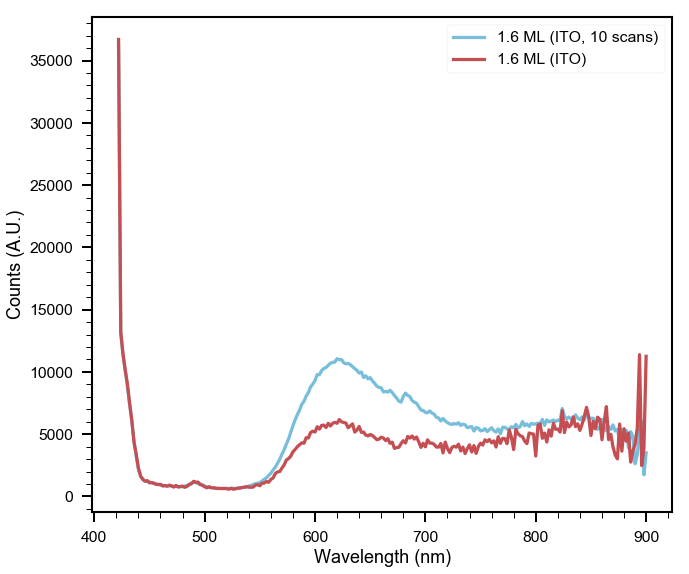

In [294]:
dfIto['1.6 ML (ITO, 10 scans)'].plot(color='c')
# (dfIto['1.6 ML (ITO, 10 scans)']/10).plot(color='c')

dfIto['1.6 ML (ITO)'].plot(color='r')
plt.legend()
plt.gca().set(xlabel='Wavelength (nm)', ylabel='Counts (A.U.)')

In [313]:
sums = []
dsums = []
maxs = []
for col in df:
    sums.append(df[col][540:].sum())
    dsums.append(np.sqrt(df[col][540:].sum()))
    maxs.append(df[col][540:].max())

In [314]:
sums, df.columns

([172592827.74619997,
  7800900.733748,
  2426313.61171,
  942946.1273399999,
  3315088.6919050002,
  3743670.3466,
  397281.75539999997],
 Index(['4ML', '2ML', '1.5ML', '0.4 ML (rep)', '0.4ML', '1.4ML Ba++',
        'Sample holder'],
       dtype='object'))

In [322]:
totITO / sums[2]

0.47531664866736195

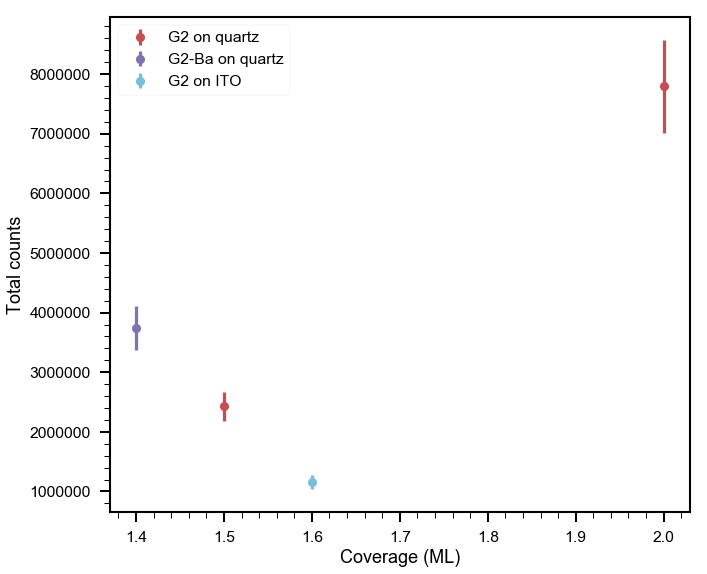

In [558]:
covs = [3.7, 2, 1.5, 0.4, 0.4, 1.4, 0]
plt.errorbar(covs[1:3], sums[1:3], yerr=0.1*np.array(sums[1:3]), fmt='ro', label='G2 on quartz')
plt.errorbar(covs[-2], sums[-2], yerr=0.1*np.array(sums[-2]), fmt='mo', label='G2-Ba on quartz')

totITO = dfIto['1.6 ML (ITO)'][540:].sum()
plt.errorbar(1.6, totITO, yerr=0.1*totITO, fmt='co', label='G2 on ITO')

plt.gca().set(ylabel='Total counts', xlabel='Coverage (ML)')
plt.legend(loc='upper left')

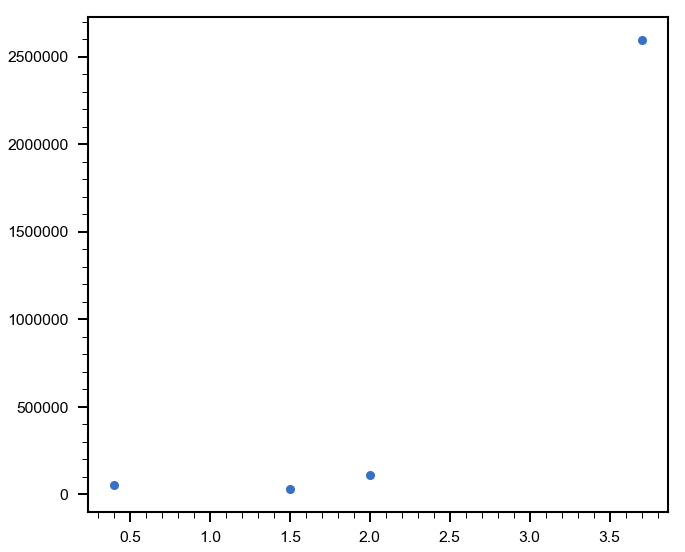

In [240]:
plt.plot(covs, maxs, 'o')


## A(PU)TES

In [105]:
def fluo_load(path: str, name: str = None, trim: int = 10):
    if name == None: 
        name = os.path.splitext(os.path.split(path)[1])[0].replace('_', ' ').replace(',', '.')
    df = pd.read_csv(path, skiprows=23, names=[name, 'no'])
    df.drop('no', axis=1, inplace=True)
    df.drop(index=df.iloc[:trim].index, inplace=True)  # Erase noisy first nanometers
    return df

In [136]:
def scale_fluo(dfi: pd.DataFrame, dfRef: pd.DataFrame):
    scale_factor = (np.max(dfRef.iloc[:,0]) - np.min(dfRef.iloc[:,0])) / (np.max(dfi.iloc[:,0]) - np.min(dfi.iloc[:,0]))
    dfi *= scale_factor
    return dfi
def norm_fluo(dfi: pd.DataFrame):
    y = dfi.iloc[:,0]
    ybase = y.apply(lambda c : c - np.min(y)  )  # If bg is subtracted this should do nothing
    ynorm = ybase.apply(lambda c :  c / np.max(ybase) )
    dfi.iloc[:,0] = ynorm
    return dfi

In [680]:
file8 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,6capas_ITO_10scans_12.txt'
G2Ito = fluo_load(file8, name= 'G2 1.6 ML (ITO)')
G2Ito['G2 1.6 ML (ITO)'] = BaG2Ito['G2 1.6 ML (ITO)']/10

file13 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,0capas_3Ba_ITO_PTES_2.txt'
BaG2Ptes = fluo_load(file13, name='G2 1ML:Ba = 3 (PTES/ITO)', trim=10)

file7 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_2,0capas_1Ba_ITO_AUTES_2.txt'
BaG2Autes = fluo_load(file7, name='G2 2ML:Ba = 3 (AUTES/ITO)')

file9 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1e-5M_1eq_Ba++_AcN.csv'
dfsol = pd.read_csv(file9, sep=';', index_col=0, skiprows=1, names=['λ (nm)', 'G2 1e-5M', 'G2 1e-5M Ba 1eq'])

file10 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,0capas_ITO_APTES.txt'
G2Aptes = fluo_load(file10, name = 'G2 1ML (APTES)')

file11 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/G2_1,0capas_5Ba_ITO_APTES.txt'
BaG2Aptes = fluo_load(file11, name = 'G2 1ML:Ba = 5 (APTES)')

file12 = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/G2/1Ba_G2_2,1capa_ITO.txt'
G2BaIto = fluo_load(file12, name= 'Ba desorbtion, G2 (ITO)')

In [677]:
G2Ito = norm_fluo(G2Ito)
G2BaIto = norm_fluo(G2BaIto)

# BaG2Ptes = norm_fluo(BaG2Ptes)
# BaG2Autes = norm_fluo(BaG2Autes)
# BaG2Aptes = norm_fluo(BaG2Aptes)
# G2Aptes = norm_fluo(G2Aptes)

In [763]:
dfsol

,G2 1e-5M,G2 1e-5M Ba 1eq
λ (nm),,
350,3413.83936,6011.74121
352,4407.78223,7775.39795
354,5281.15576,9166.35449
356,7097.69824,11777.89450
358,10646.63090,15280.59570
...,...,...
792,208903.00000,142261.40600
794,209466.54700,135161.03100
796,201131.60900,133122.37500


(0.0, 1.0)

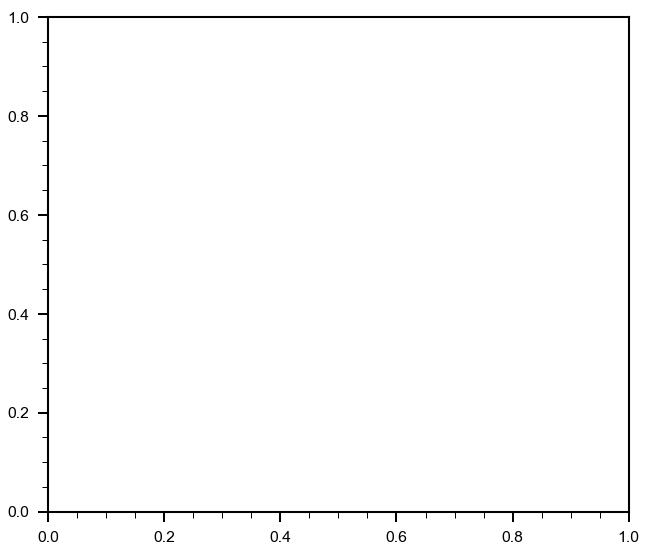

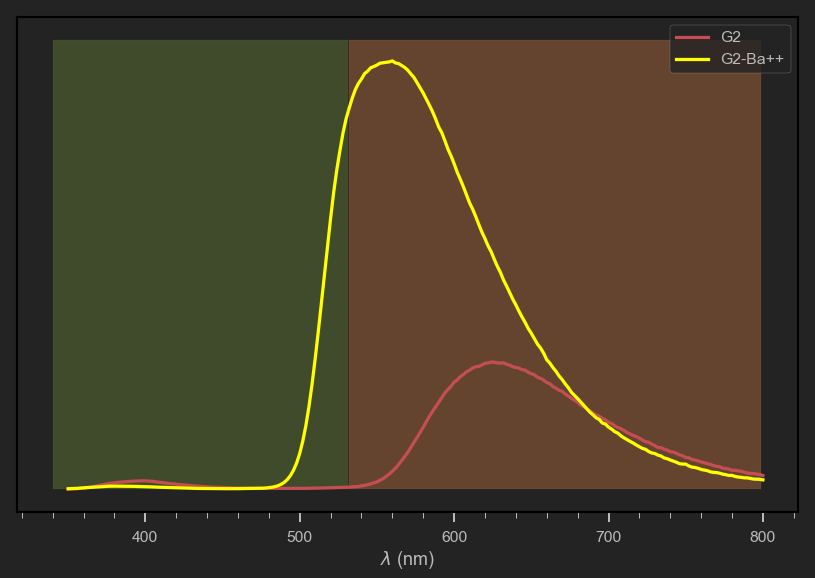

In [805]:
# plt.plot(G2Ito, 'b',label=G2Ito.columns[0])
# plt.plot(G2Aptes,'m', label=G2Aptes.columns[0])
# plt.plot(BaG2Autes,'r', label=BaG2Autes.columns[0])
jtplot.style('monokai', context='talk', grid=False, ticks=True, fscale=1.5)
plt.plot(dfsol['G2 1e-5M'], 'r', label='G2')
plt.plot(dfsol['G2 1e-5M Ba 1eq'], 'yellow', label='G2-Ba++')
dm0 =np.arange(340, 532)
ym = plt.gca().get_ylim()[1]
plt.fill_between(x=dm0, y1=0, y2=ym, color='g', alpha=0.3)
dm1 =np.arange(532, 800)
plt.fill_between(x=dm1, y1=0, y2=ym, color='y', alpha=0.3)

plt.legend()
# plt.gca().set(xlim=(500,750), ylim=(-0.1, 1.1))
plt.gcf().set_figwidth(14)
plt.gca().set(xlabel='$\lambda$ (nm)', yticks=[])
jtplot.style('grade3', context='talk', grid=False, ticks=True, fscale=1.5)

In [773]:
dfsol['G2 1e-5M Ba 1eq'].index[105]

560

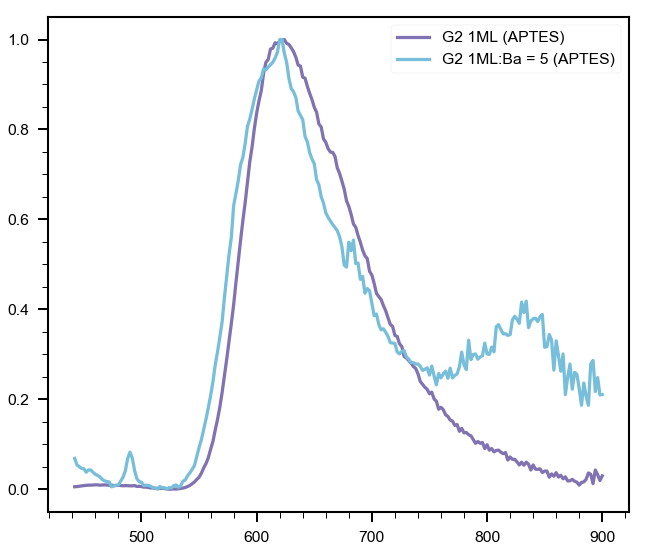

In [176]:
plt.plot(G2Aptes,'m', label=G2Aptes.columns[0])
plt.plot(BaG2Aptes, 'c',label=BaG2Aptes.columns[0])

plt.legend()

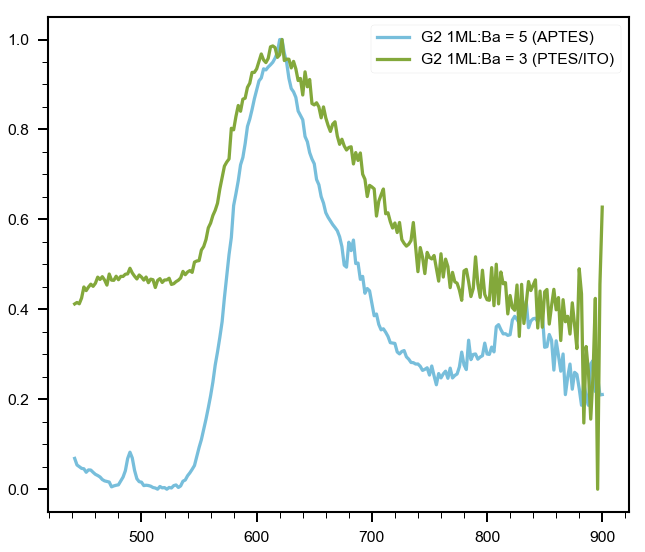

In [449]:
# plt.plot(G2Aptes, 'm', label=G2Aptes.columns[0])
plt.plot(BaG2Aptes, 'c', label=BaG2Aptes.columns[0])
# plt.plot(BaG2Autes, 'r', label=BaG2Autes.columns[0])
plt.plot(BaG2Ptes, 'g', label=BaG2Ptes.columns[0])
plt.legend()

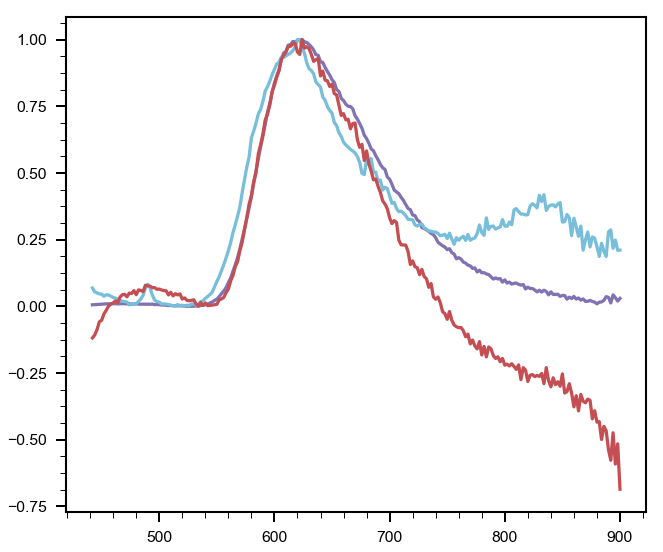

In [475]:
yaut = BaG2Autes.iloc[:,0]
idxmin = yaut[500:600].idxmin()
yaut -= yaut[idxmin]
yaut /= yaut.max()
plt.plot(G2Aptes, 'm', label=G2Aptes.columns[0])
plt.plot(BaG2Aptes, 'c', label=BaG2Aptes.columns[0])
plt.plot(yaut, 'r')

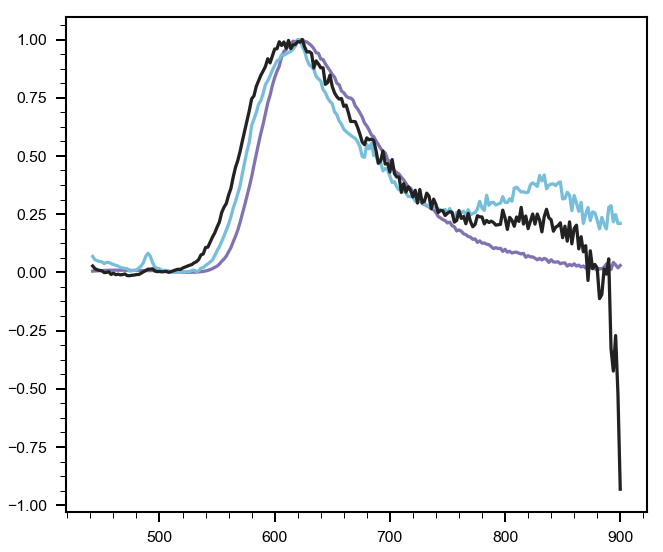

In [482]:
ybaito = G2BaIto.iloc[:,0]
idxmin = ybaito[500:600].idxmin()
ybaito -= ybaito[idxmin]
ybaito /= ybaito.max()
plt.plot(G2Aptes, 'm', label=G2Aptes.columns[0])
plt.plot(BaG2Aptes, 'c', label=BaG2Aptes.columns[0])
plt.plot(ybaito, 'k')

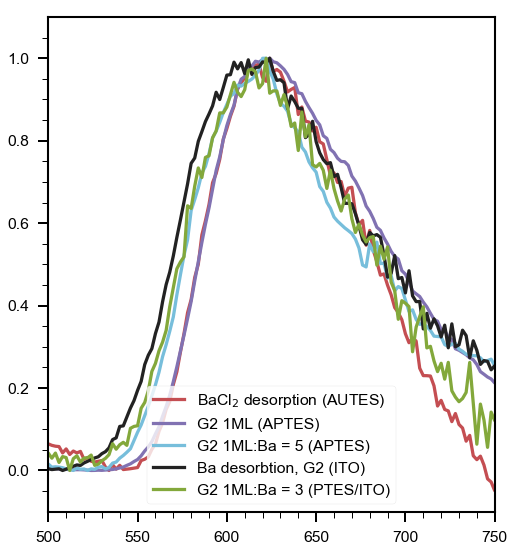

In [483]:
plt.plot(yaut, 'r', label='BaCl$_2$ desorption (AUTES)')
plt.plot(G2Aptes, 'm', label=G2Aptes.columns[0])
plt.plot(BaG2Aptes, 'c', label=BaG2Aptes.columns[0])
plt.plot(ybaito, 'k', label=G2BaIto.columns[0])
plt.plot(ypt, 'g')
plt.gca().set(xlim=(500,750), ylim=(-0.1, 1.1))
plt.gcf().set_figwidth(8)
plt.legend()

In [127]:
dfIto

,1.6 ML (ITO)
442.0,1646.97734
444.0,1351.95078
446.0,1224.92900
448.0,1188.85352
450.0,1159.82236
...,...
892.0,3357.00703
894.0,5264.30391
896.0,6033.30039
898.0,1735.52754


# Extra: qITO-G2

## G2/ITO

In [37]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2021_12_22_qITO/'
files = glob.glob(path+'/**/*.uxy')
files.sort()
files

['/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2021_12_22_qITO/proc/20211221_qITO_FBIG2_subl_60min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2021_12_22_qITO/proc/20211221_qITO_clean1.uxy']

In [222]:
itog2 = read_processed_xp(files[0])
itog2.area['layers'], itog2.area['dlayers']

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2021_12_22_qITO/proc/20211221_qITO_FBIG2_subl_60min.uxy.ft', returning empty fit dict


(1.6563495025536086, 0.03072229160975212)

## G2/PTES/ITO

In [222]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/'
files = glob.glob(path+'/**/*.uxy')
files.sort()
files

['/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES_FBIG2_subl_040min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES_FBIG2_subl_080min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES_FBIG2_subl_120min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES_FBIG2_subl_160min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES_FBIG2_subl_160min_BaCl2_8min.uxy']

In [223]:
ptesg2 = [read_processed_xp(f) for f in files]
# ptesg2.area['layers'], ptesg2.area['dlayers']

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES_FBIG2_subl_040min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES_FBIG2_subl_080min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES_FBIG2_subl_120min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES_FBIG2_subl_160min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_P

In [224]:
ptesg2[5].name

'qITO_PTES_FBIG2_subl_160min_BaCl2_8min'

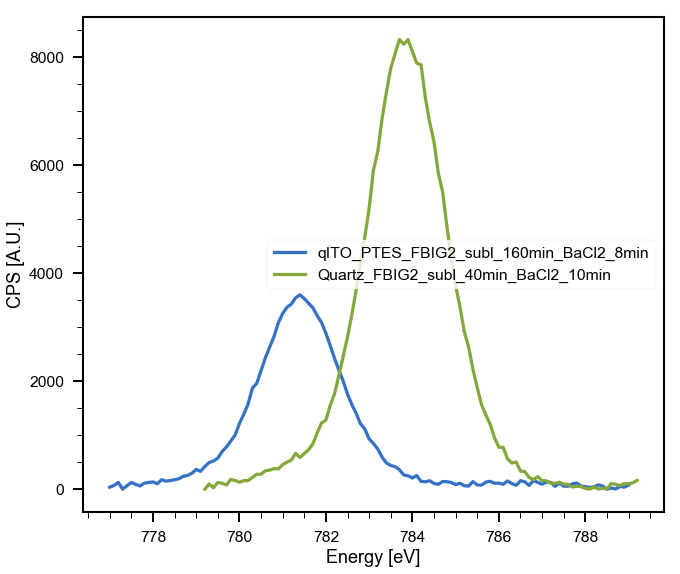

In [225]:
plot_region(ptesg2[5], 'Ba3d')
plot_region(unscaled[20], 'Ba3d')

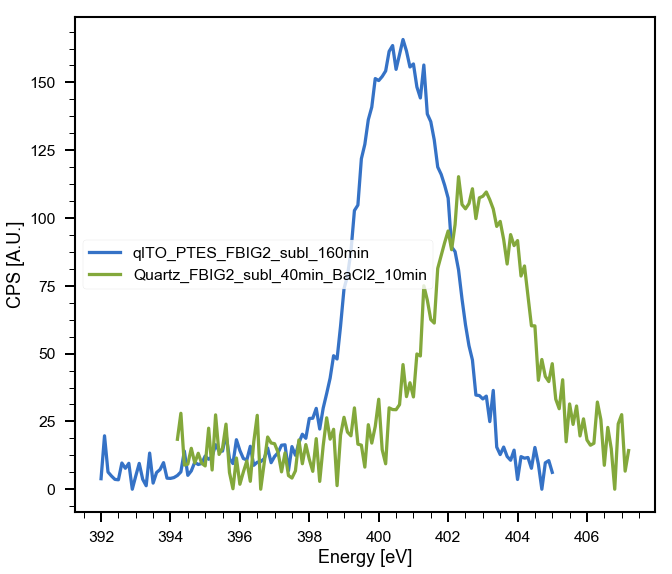

In [226]:
plot_region(ptesg2[4], 'N1s')
plot_region(unscaled[20], 'N1s')

In [227]:
ptesg2[4].area['FBI-G2'] = ptesg2[4].area['N1s']/3
(ptesg2[5].area['Ba3d']) / (ptesg2[4].area['FBI-G2'])

3.5565010915844293

In [228]:
unscaled[20].area['Ba3d']/ ptesg2[5].area['Ba3d'], unscaled[23].area['Ba3d']/ ptesg2[5].area['Ba3d']

(2.136562220868736, 1.8609179406660312)

In [147]:
trim_spectra(ptesg2[4], ptesg2[5], 'N1s', inplace=True);

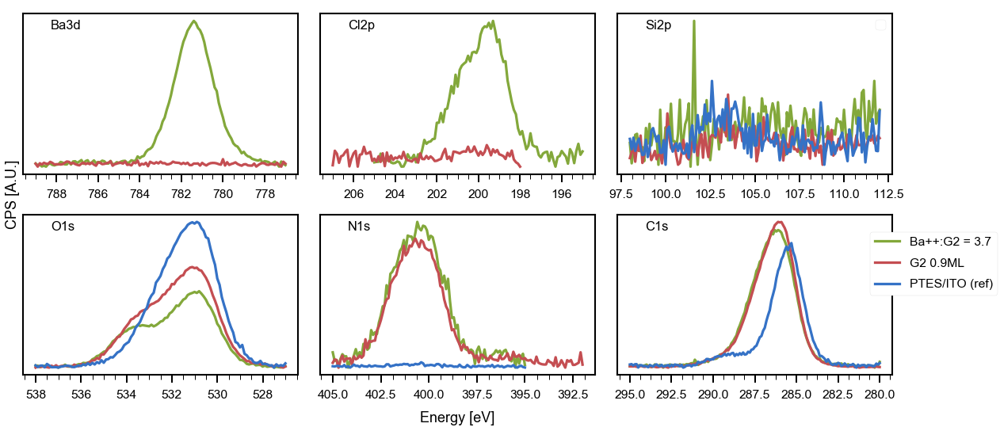

In [229]:
selptes = [deepcopy(xp) for xp in [ptesg2[0], ptesg2[4], ptesg2[5]] ]
names = ['PTES/ITO (ref)', 'G2 0.9ML', 'Ba++:G2 = 3.7']
cols = ['b', 'r', 'g']
for xp, n, c in zip(selptes, names, cols):
    xp.name = n
    xp.color = c
regs = ['Ba3d', 'Cl2p', 'Si2p', 'O1s', 'N1s', 'C1s']
ax = plot_xp_regions(selptes[::-1], regs, ncols=3);
ax[0,0].invert_xaxis()
ax[0,1].invert_xaxis()
ax[0,2].invert_xaxis()

'Cl2p' region does not exist in PTES/ITO (ref)


[187.496815590112, 1278.1711892320468]

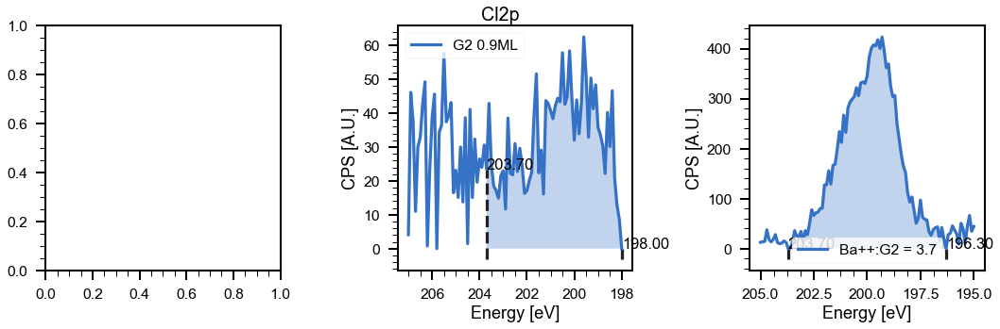

In [230]:
integrateRegions(selptes, 'Cl2p', asf)

### Correct O 1s contribution

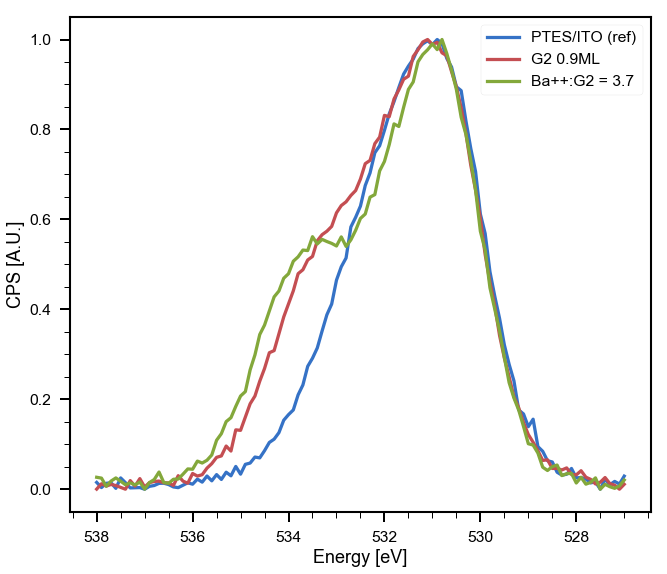

In [231]:
norm = [normalise_dfx(xp) for xp in selptes]
region = 'O1s'
for xp in norm:
    plot_region(xp, region)

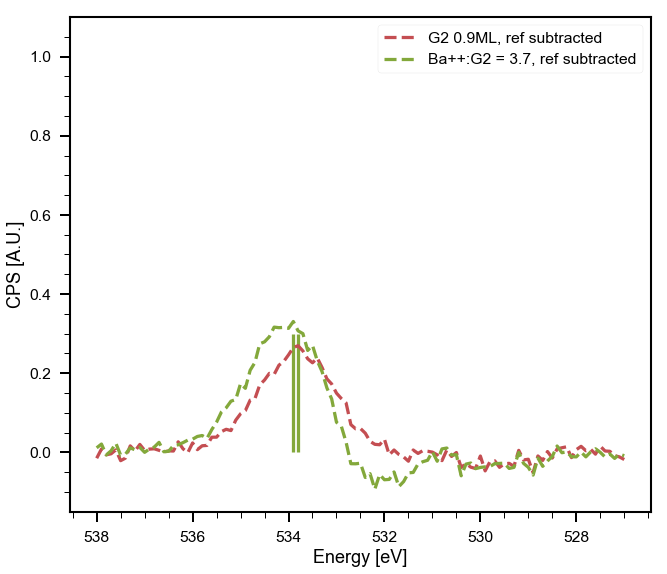

In [256]:
region = 'O1s'
for xp in subo1s:
    plot_region(xp, region)
    
# for xp in norm:
#     plot_region(xp, region)
plt.gca().set(ylim=(-0.15, 1.1))
plt.gca().invert_xaxis()
plt.vlines(533.9, 0, 0.3, 'g')
plt.vlines(533.8, 0, 0.3, 'g')

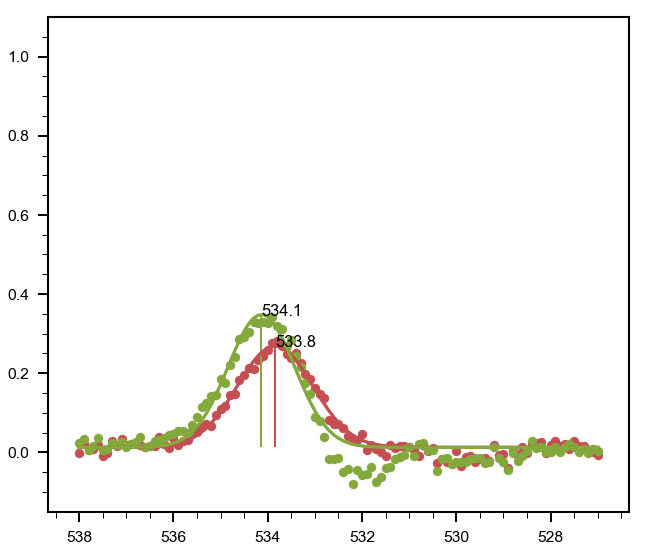

In [258]:
region = 'O1s'
for xp in subo1s:
    fn = XPFit(xp, region, )
    fn.voigt()
    plot_fit_result(xp, region)
    

plt.gca().set(ylim=(-0.15, 1.1))
plt.gca().invert_xaxis()

In [250]:
posmx0 = subo1s[0].dfx[region].dropna().counts.idxmax()
subo1s[0].dfx[region].dropna().energy.iloc[posmx0]

533.8

In [251]:
posmx1 = subo1s[1].dfx[region].dropna().counts.idxmax()
subo1s[1].dfx[region].dropna().energy.iloc[posmx1]

533.9

In [244]:
subo1s = []
subo1s.append(subtract_ref_region(norm[1], norm[0], region))
subo1s.append(subtract_ref_region(norm[2], norm[0], region))
subo1s[0].ls='--'
subo1s[0].name='G2 0.9ML, ref subtracted'
subo1s[1].ls='--'
subo1s[1].name='Ba++:G2 = 3.7, ref subtracted'

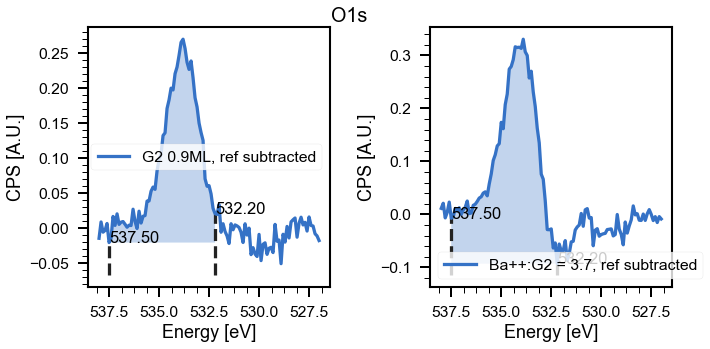

In [234]:
region = 'O1s'
integrateRegions(subo1s, region, asf)
y = selptes[1].dfx[region].dropna().counts
normfactor = np.max(y)

subo1s[0].area['O1s'] *= normfactor
y = selptes[2].dfx[region].dropna().counts
normfactor = np.max(y)
subo1s[1].area['O1s'] *= normfactor

### Correct C 1s contribution

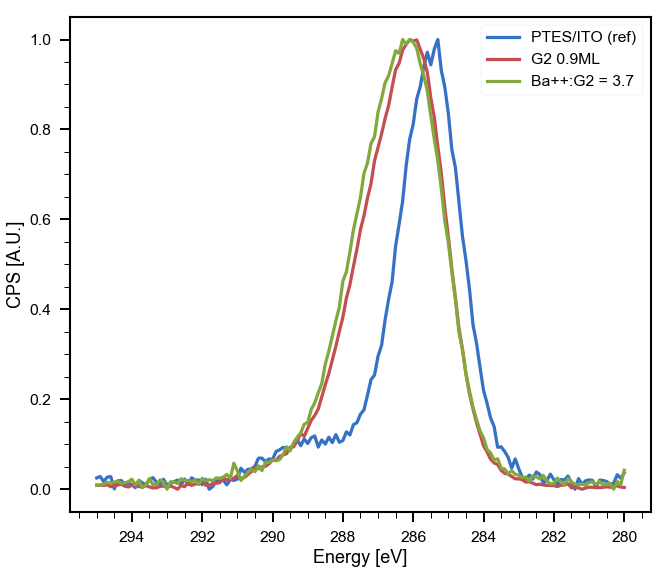

In [235]:
norm = [normalise_dfx(xp) for xp in selptes]
region = 'C1s'
for xp in norm:
    plot_region(xp, region)

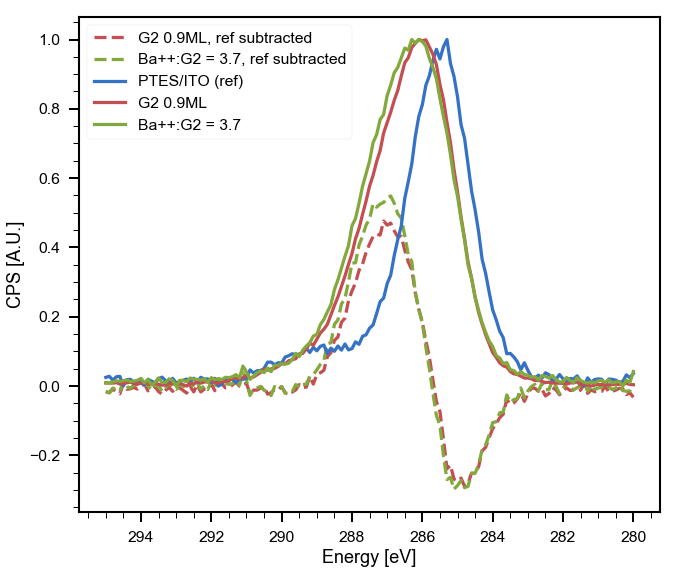

In [238]:
for xp in subo1s:
    plot_region(xp, region)
    
for xp in norm:
    plot_region(xp, region)

In [237]:
subo1s[0] = subtract_ref_region(norm[1], norm[0], region)
subo1s[1] = subtract_ref_region(norm[2], norm[0], region)
subo1s[0].ls='--'
subo1s[0].name='G2 0.9ML, ref subtracted'
subo1s[1].ls='--'
subo1s[1].name='Ba++:G2 = 3.7, ref subtracted'

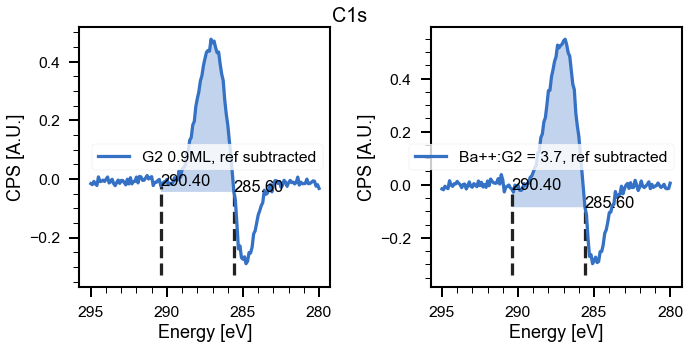

In [239]:
region='C1s'
integrateRegions(subo1s, region, asf, eup=290.4, edw=285.6)
y = selptes[1].dfx[region].dropna().counts
normfactor = np.max(y)

subo1s[0].area[region] *= normfactor
y = selptes[2].dfx[region].dropna().counts
normfactor = np.max(y)
subo1s[1].area[region] *= normfactor

In [240]:
subo1s[0].area

{'C1s': 4795.755153125656,
 'N1s': 1051.5176577503955,
 'O1s': 12235.096366133694,
 'In3d': 8339.28000717948,
 'Sn3d': 8308.673773546863,
 'Ba3d': 115.32238709417541,
 'layers': 0.8810064155120811,
 'dlayers': 0.012713570775412191,
 'FBI-G2': 350.5058859167985,
 'Cl2p': 210.43413646477217}

## Corrected Stoichometry

In [241]:
ag2sto = {'C1s': 31, 'O1s':5, 'N1s':3}
g2sto = XPS_experiment(name='Stoichiometry FBI-G2', area=ag2sto)

num, denom = (('N1s', 'C1s', 'C1s'), ('O1s', 'N1s', 'O1s'))
display_stoichiometry(subo1s+[g2sto],  num=num, denom=denom)

num, denom = (('N1s', 'Cl2p') , ('Ba3d', 'Ba3d'))
display_stoichiometry([subo1s[1]],  num=num, denom=denom)

In [196]:
subo1s[1].area

{'C1s': 19131.190635048675,
 'N1s': 2130.2620260480408,
 'O1s': 1635.8547307871004,
 'In3d': 6543.045687185631,
 'Sn3d': 7999.338624340444,
 'Ba3d': 1364.5134780982128,
 'Cl2p': 1215.2667213499647}

### Dev: last scan in 120 min G2 subl

In [3]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/'
files = glob.glob(path+'/*.xy')
files.sort()
files

['/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/20220113_qITO_PTES.xy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/20220113_qITO_PTES_FBIG2_subl_120min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/20220113_qITO_PTES_FBIG2_subl_120min_In3d.xy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/20220113_qITO_PTES_FBIG2_subl_40min.xy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/20220113_qITO_PTES_FBIG2_subl_80min.xy']

In [9]:
dels = xy_multiscan_delimiters(files[2])
dels
xpraw = import_multiscan_df(files[2], *dels[:])
xpraw['In3d']

,scan0,scan1,scan2,scan3,scan4
energy_In3d,,,,,
460.0,2812.50,2831.25,2886.25,2813.75,2937.50
459.9,2790.00,2806.25,2923.75,2731.25,2885.00
459.8,2876.25,2783.75,2672.50,2952.50,2953.75
459.7,2838.75,2883.75,2795.00,2787.50,2995.00
459.6,2871.25,2825.00,2712.50,2750.00,2940.00
...,...,...,...,...,...
437.4,1826.25,1788.75,1790.00,1576.25,1442.50
437.3,1815.00,1760.00,1823.75,1571.25,1612.50
437.2,1826.25,1752.50,1831.25,1528.75,1585.00


In [70]:
dfx = pd.DataFrame(xpraw['In3d']['scan4'])
names = ['In3d']
index2 = np.array(['energy', 'counts'])
mi = pd.MultiIndex.from_product([names, index2], names=['range', 'properties'])
mi.to_frame()
dfx['energy'] = dfx.index
dfx['counts'] = dfx['scan4']
dfx.drop('scan4', axis=1, inplace=True)
dfx.reset_index(inplace=True, drop=True)
dfx.columns = mi

dfx

range        In3d         
properties energy   counts
0           460.0  2937.50
1           459.9  2885.00
2           459.8  2953.75
3           459.7  2995.00
4           459.6  2940.00
..            ...      ...
226         437.4  1442.50
227         437.3  1612.50
228         437.2  1585.00
229         437.1  1581.25
230         437.0  1583.75

[231 rows x 2 columns]

In [71]:
name = os.path.split(files[3])[1][9:]
xpscan = XPS_experiment(path = files[3], dfx = dfx, delimiters = dels, name = name, color = None, ls = None,
                        label = name, date = None, other_meta = None, area = None, fit = None)

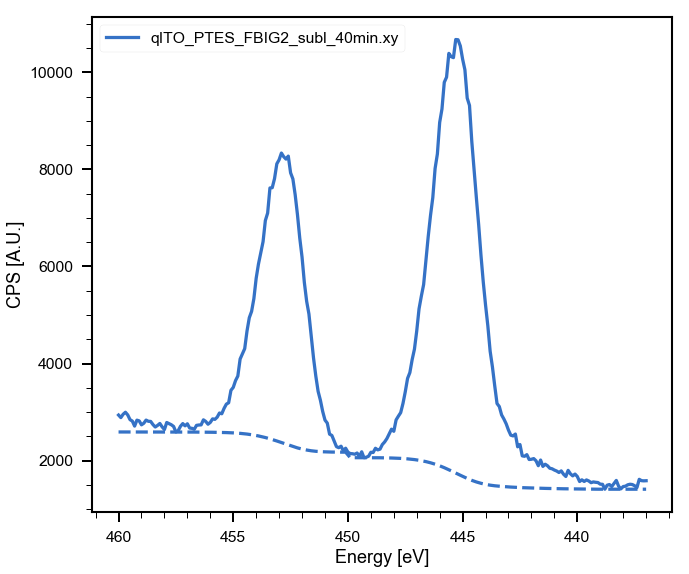

In [72]:
region = 'In3d'
bgscan = subtract_double_shirley(xpscan, region, xlim=450, maxit=50)

In [56]:
xpref = read_processed_xp('/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES.uxy')

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_13_qITO_PTES/proc/20220113_qITO_PTES.uxy.ft', returning empty fit dict


In [77]:
bgscan.area={}

[49348.07932617243, 40034.07563047658]

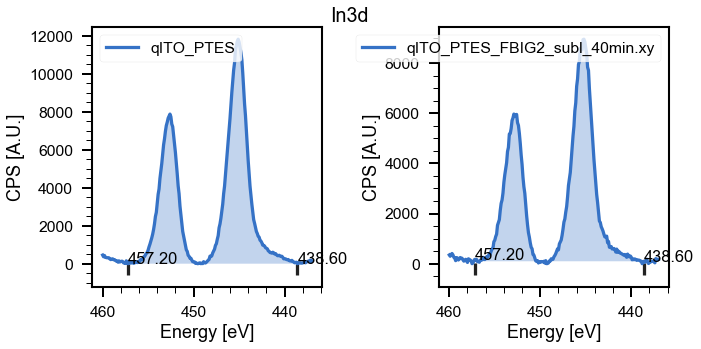

In [78]:
integrateRegions([xpref, bgscan], region='In3d', asf=asf)

In [82]:
arrange_coverages([xpref, bgscan], [[1, 0]],
                               r_ml = 1.1*nm, region='In3d', mfp = 3.05*nm, takeoff = 10)

matrix([[0.6313455 , 0.00886617]])

## G2/BaCl2/AUTES/ITO

In [384]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES'
files = glob.glob(path+'/**/*.uxy')
files.sort()
files

['/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES_110ºC.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES_BaCl2.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES_BaCl2_110ºC.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES_BaCl2_180ºC.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES_BaCl2_180ºC_FBIG2_1h.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES_BaCl2_180ºC_FBIG2_2h.uxy']

In [385]:
autesg2ba = [read_processed_xp(f) for f in files]
# ptesg2.area['layers'], ptesg2.area['dlayers']

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES_110ºC.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES_BaCl2.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES_BaCl2_110ºC.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AUTES_BaCl2_180ºC.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_20_qITO_AUTES/proc/20220120_qITO_AU

In [298]:
autesg2ba[5].name

'qITO_AUTES_BaCl2_180ºC_FBIG2_1h'

'In3d_(2)' region does not exist in qITO_AUTES
'In3d_(2)' region does not exist in qITO_AUTES_110ºC
'In3d_(2)' , asf missing, returning raw area
'In3d_(2)' , asf missing, returning raw area
'In3d_(2)' , asf missing, returning raw area
'In3d_(2)' , asf missing, returning raw area
'In3d_(2)' , asf missing, returning raw area


[14876.763170321425,
 15142.1047777579,
 16380.050556118656,
 12813.305316392685,
 9467.691078784244]

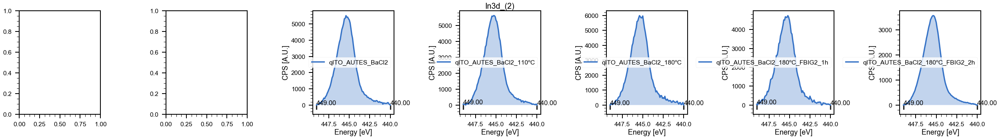

In [388]:
integrateRegions(autesg2ba, 'In3d_(2)', asf=asf)

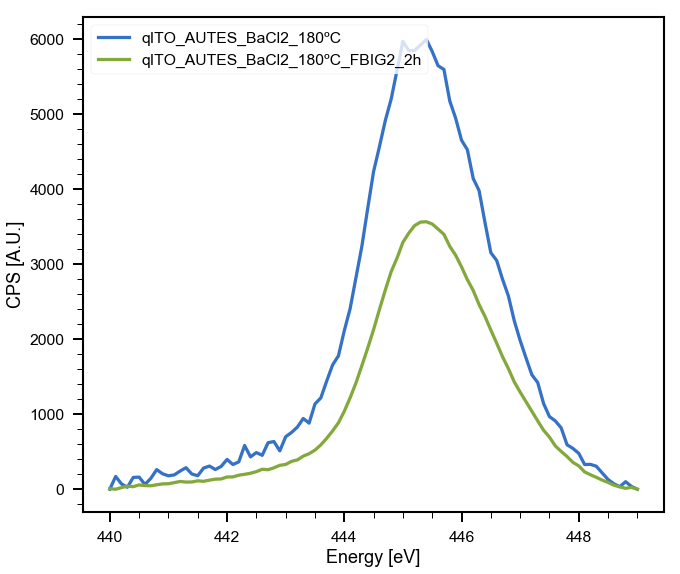

In [387]:
plot_region(autesg2ba[4], 'In3d_(2)')
plot_region(autesg2ba[6], 'In3d_(2)')

'In3d_(2)' region does not exist in qITO_AUTES
'In3d_(2)' region does not exist in qITO_AUTES_110ºC
'In3d_(2)' , asf missing, returning raw area
'In3d_(2)' , asf missing, returning raw area
'In3d_(2)' , asf missing, returning raw area
'In3d_(2)' , asf missing, returning raw area
'In3d_(2)' , asf missing, returning raw area


[14876.763170321425,
 15142.1047777579,
 16380.050556118656,
 12813.305316392685,
 9467.691078784244]

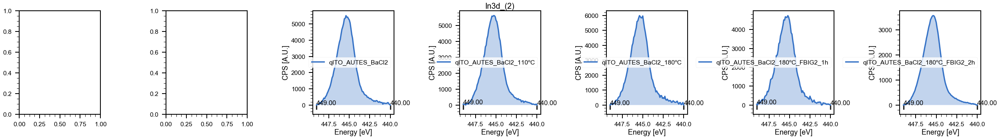

In [223]:
integrateRegions(autesg2ba, 'In3d_(2)', asf=asf)

'Cl2p' region does not exist in qITO_AUTES
'Cl2p' region does not exist in qITO_AUTES_110ºC
'Cl2p' region does not exist in qITO_AUTES_BaCl2_110ºC
'Cl2p' region does not exist in qITO_AUTES_BaCl2_180ºC
'Cl2p' region does not exist in qITO_AUTES_BaCl2_180ºC_FBIG2_1h


[471.1036300713898, 318.5731628070608]

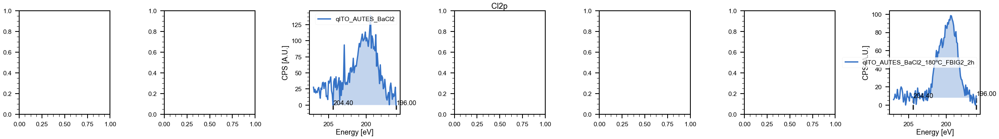

In [502]:
integrateRegions(autesg2ba, 'Cl2p', asf=asf)

In [508]:
autesg2ba[4].area['Cl2p_(3)'], autesg2ba[2].area['Cl2p']

(221.18656437918142, 528.7358362192927)

In [505]:
autesg2ba[4].area['Ba3d'], autesg2ba[2].area['Ba3d']

(461.8932474204285, 474.40461742916716)

In [506]:
autesg2ba[4].area['Cl2p_(3)'] / autesg2ba[4].area['Ba3d'], autesg2ba[2].area['Cl2p'] / autesg2ba[2].area['Ba3d']

(0.4788694478961522, 1.1145250631929982)

In [225]:
inds = [[5, 6,4]]
arrange_coverages(autesg2ba, inds, r_ml=1.1, region='In3d_(2)', mfp=3.05, takeoff=10)

matrix([[0.72837962, 0.01793515],
        [1.49685967, 0.073601  ]])

[247.0090886862573, 247.0090886862573]

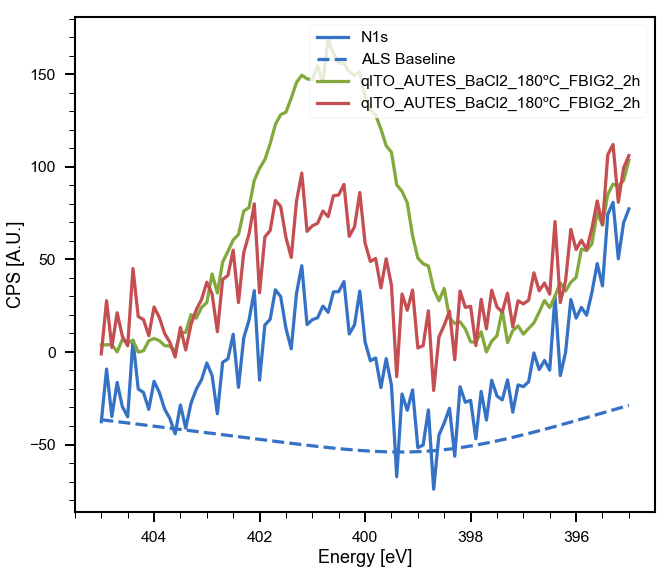

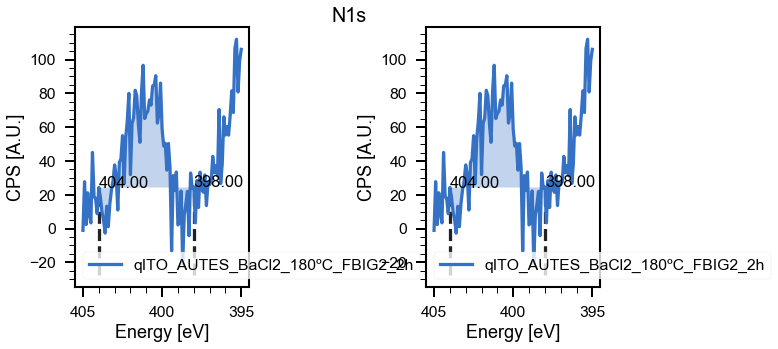

In [389]:
autesg2n1s = subtract_ref_region(autesg2ba[6], autesg2ba[4], 'N1s')
autesg2n1s = subtract_als_bg(autesg2n1s, 'N1s')
plot_region(autesg2ba[6], 'N1s')
plot_region(autesg2n1s, 'N1s')

integrateRegions([autesg2n1s, autesg2n1s], 'N1s', asf=asf, eup=404, edw=398)

In [253]:
autesg2n1s.area

{'C1s': 18546.511505630267,
 'N1s': 517.8387603485478,
 'O1s': 8337.668628653333,
 'In3d_(2)': 2171.986941680258,
 'Ba3d': 502.1784445611108,
 'Cl2p': 357.5456372694285,
 'layers': 1.4968596723603462,
 'dlayers': 0.07360099597363773,
 'G2': -56.79186418684943}

In [246]:
autesg2ba[6].area

{'C1s': 18546.511505630267,
 'N1s': -170.37559256054828,
 'O1s': 8337.668628653333,
 'In3d_(2)': 2171.986941680258,
 'Ba3d': 502.1784445611108,
 'Cl2p': 357.5456372694285,
 'layers': 1.4968596723603462,
 'dlayers': 0.07360099597363773,
 'G2': -56.79186418684943}

In [254]:
autesg2ba[6].area['N1s'] = autesg2n1s.area['N1s']
autesg2ba[6].area['G2'] = autesg2ba[6].area['N1s']/3
autesg2ba[6].area['Ba3d'] / autesg2ba[6].area['G2']

2.909274950120209

In [390]:
trim_spectra(autesg2ba[6], autesg2ba[4], 'Si2p', inplace=True);

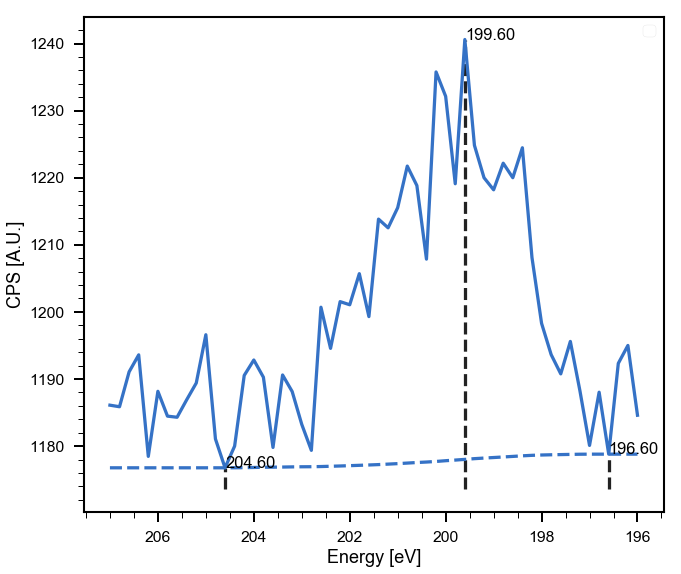

In [391]:
autesg2ba[4] = subtract_shirley_bg(autesg2ba[4], 'Cl2p_(3)', maxit=40)

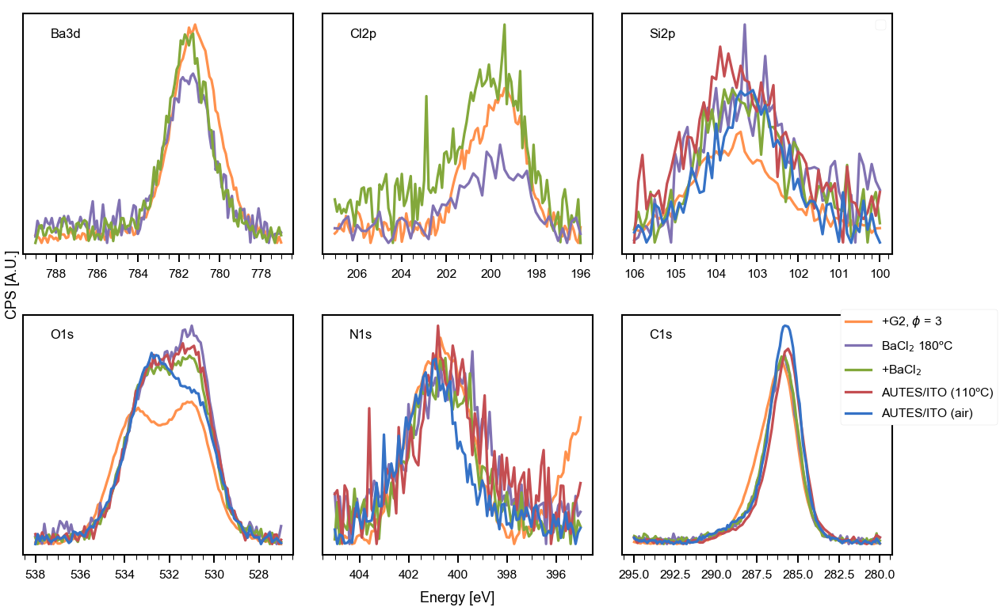

In [392]:
sel = [deepcopy(autesg2ba[i]) for i in [0, 1, 2, 4, 6]]
names = ['AUTES/ITO (air)', 'AUTES/ITO (110ºC)', '+BaCl$_2$', 'BaCl$_2$ 180ºC' , '+G2, $\phi$ = 3']
cols = ['b', 'r', 'g', 'm', 'y']
for xp, n, c in zip(sel, names, cols):
    xp.name = n
    xp.color = c
regs = ['Ba3d', 'Cl2p', 'Si2p', 'O1s', 'N1s', 'C1s']
ax = plot_xp_regions(sel[::-1], regs, ncols=3);
# ax[0,0].invert_xaxis()
ax[0,1].invert_xaxis()
ax[0,1].plot(sel[3].dfx['Cl2p_(3)'].dropna().energy, sel[3].dfx['Cl2p_(3)'].dropna().counts, 'm')
# ax[0,2].invert_xaxis()
plt.gcf().set_figheight(12)

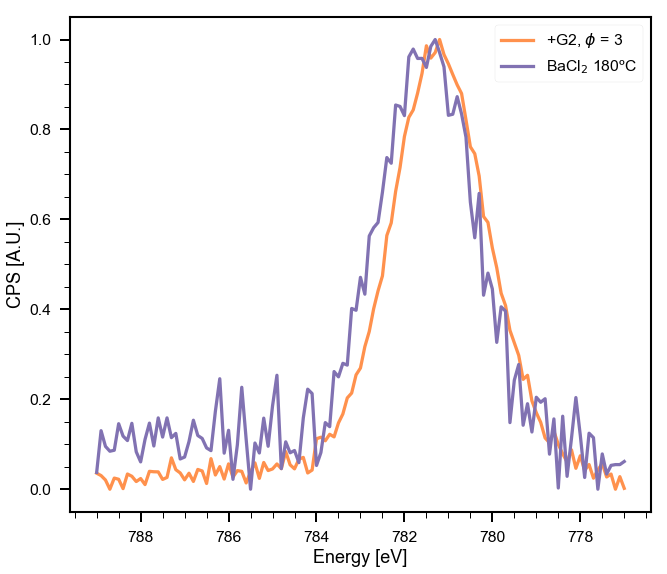

In [308]:
sel[4] = normalise_dfx(sel[4])
sel[3] = normalise_dfx(sel[3])

plot_region(sel[4], 'Ba3d')
plot_region(sel[3], 'Ba3d')
plt.gca().invert_xaxis()

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcbe46587f0>, 93.31381425029414)

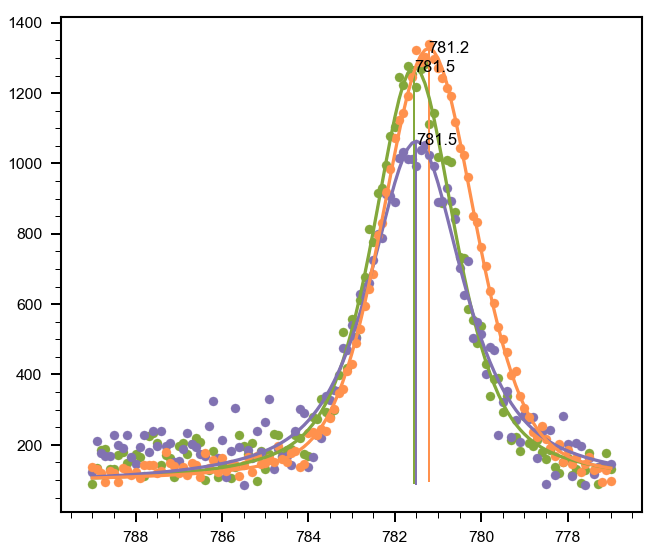

In [394]:
region = 'Ba3d'
fn0 = XPFit(sel[2], region)
fn0.voigt()
fn1 = XPFit(sel[3], region)
fn1.voigt()
fn2 = XPFit(sel[4], region)
fn2.voigt()
plot_fit_result(sel[2], region)
plot_fit_result(sel[3], region)
plot_fit_result(sel[4], region)
# plt.gca().invert_xaxis()

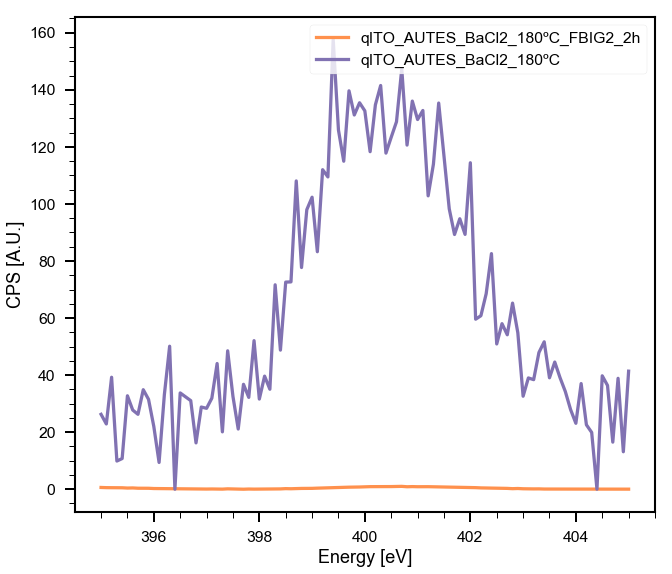

In [307]:
plot_region(autesg2ba[6], 'N1s')
plot_region(autesg2ba[4], 'N1s')

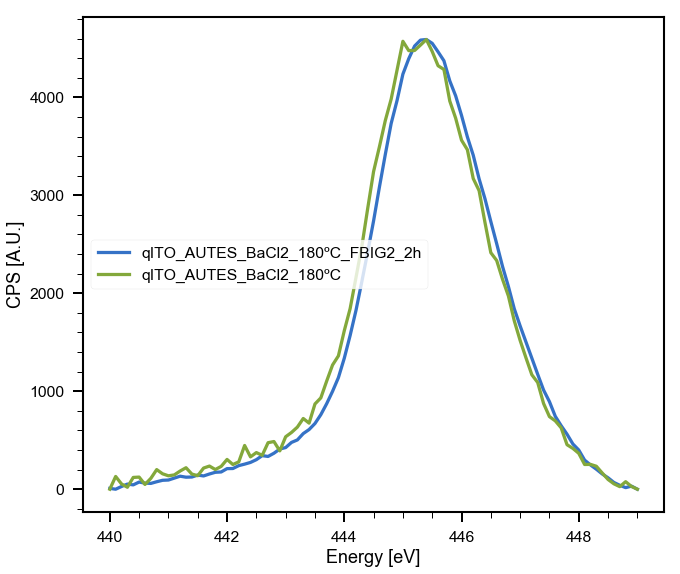

In [198]:
plot_region(autesg2ba[6], 'In3d_(2)')
plot_region(autesg2ba[4], 'In3d_(2)')

In [303]:
autesg2ba[4].area, autesg2ba[5].area

({'C1s': 17595.11180348716,
  'N1s': 1241.322495507712,
  'O1s': 11043.109242856499,
  'Ba3d': 461.8932474204285,
  'Cl2p': 1e-10,
  'In3d_(2)': 3757.7541996142822},
 {'C1s': 20828.063233883804,
  'N1s': 1911.9360839414674,
  'O1s': 10327.34877365187,
  'Ba3d': 556.1470413084307,
  'Cl2p': 1e-10,
  'In3d_(2)': 2939.5056931389504,
  'layers': 958382.1953379725,
  'dlayers': 96093.24994572486})

In [305]:
autesg2ba[5].area['FBI-G2'] = autesg2ba[5].area['N1s'] / 3

In [306]:
autesg2ba[5].area['Ba3d'] / autesg2ba[5].area['FBI-G2']

0.8726448221458277

In [304]:
arrange_coverages(autesg2ba, [[5,4]], r_ml=1.1*nm, region='In3d_(2)', mfp=4.359*nm, takeoff=10)

matrix([[0.98957218, 0.02436659]])

## G2/BaCl2/ITO

In [180]:
path = '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_21_BaCl2_ITO/'
files = glob.glob(path+'/**/*.uxy')
files.sort()
files

['/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_21_BaCl2_ITO/proc/20220120_qITO_clean.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_21_BaCl2_ITO/proc/20220121_qITO_BaCl2_1min.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_21_BaCl2_ITO/proc/20220121_qITO_BaCl2_1min_200ºC.uxy',
 '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_21_BaCl2_ITO/proc/20220121_qITO_BaCl2_FBIG2_subl_30min.uxy']

In [24]:
g2baito = [read_processed_xp(f) for f in files]
cols = ['b', 'g', 'm', 'r']
names = ['ITO clean', 'BaCl$_2$/ITO', 'BaCl$_2$ 200 ºC/ITO', 'G2 1ML/BaCl$_2$/ITO']
for c, n, xp in zip(cols, names, g2baito):
    xp.color = c
    xp.name = n

[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_21_BaCl2_ITO/proc/20220120_qITO_clean.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_21_BaCl2_ITO/proc/20220121_qITO_BaCl2_1min.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_21_BaCl2_ITO/proc/20220121_qITO_BaCl2_1min_200ºC.uxy.ft', returning empty fit dict
[Errno 2] No such file or directory: '/Users/pabloherrero/sabat/xps_spectra/ITO_FBIG2/2022_01_21_BaCl2_ITO/proc/20220121_qITO_BaCl2_FBIG2_subl_30min.uxy.ft', returning empty fit dict


In [318]:
g2baito[0].dfx.columns

MultiIndex([(        'C1s', 'energy'),
            (        'C1s', 'counts'),
            (       'Ba3d', 'energy'),
            (       'Ba3d', 'counts'),
            (       'Cl2p', 'energy'),
            (       'Cl2p', 'counts'),
            (        'N1s', 'energy'),
            (        'N1s', 'counts'),
            (        'O1s', 'energy'),
            (        'O1s', 'counts'),
            (       'In3d', 'energy'),
            (       'In3d', 'counts'),
            (   'overview', 'energy'),
            (   'overview', 'counts'),
            (       'Si2p', 'energy'),
            (       'Si2p', 'counts'),
            (   'In3d_(2)', 'energy'),
            (   'In3d_(2)', 'counts'),
            (   'Si2p_(2)', 'energy'),
            (   'Si2p_(2)', 'counts'),
            (     'C1s_bg', 'energy'),
            (     'C1s_bg', 'counts'),
            (     'N1s_bg', 'energy'),
            (     'N1s_bg', 'counts'),
            (     'O1s_bg', 'energy'),
            (     'O1s_bg

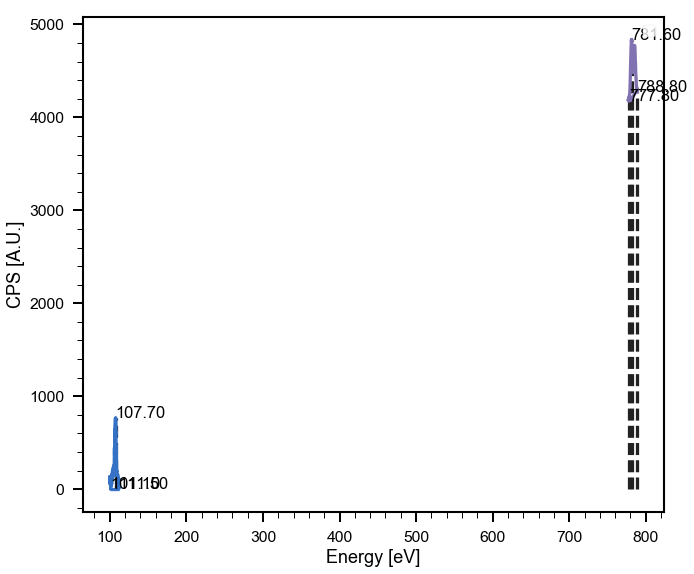

In [358]:
g2baito[0] = subtract_shirley_bg(g2baito[0], 'Si2p_(2)', maxit=40)
g2baito[2] = subtract_shirley_bg(g2baito[2], 'Ba3d(2)', maxit=40)


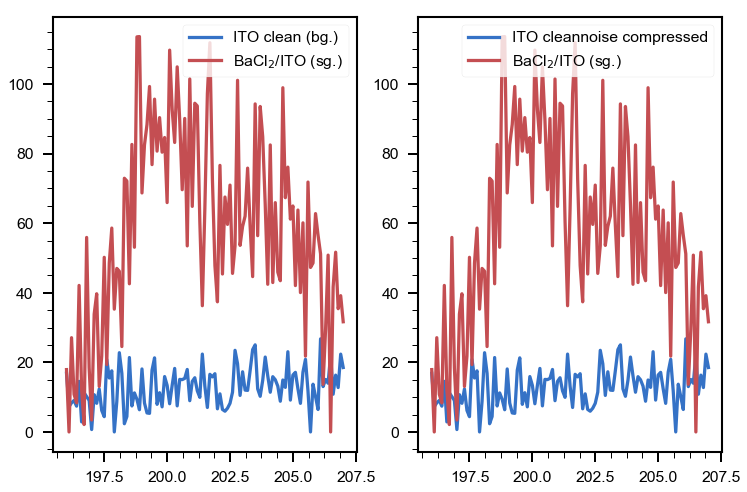

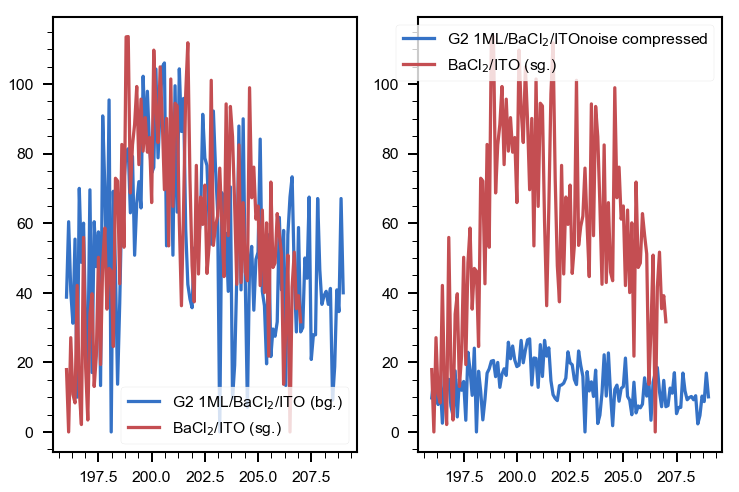

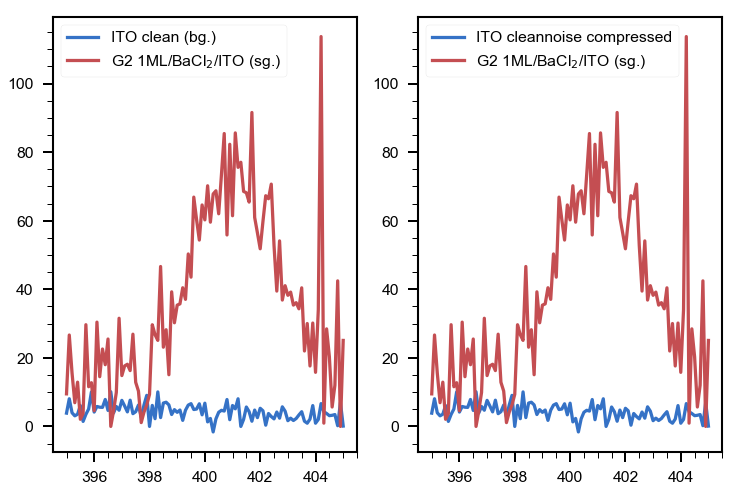

In [340]:
compress_noisy_region(g2baito[0], g2baito[1], 'Cl2p', inplace=True)
compress_noisy_region(g2baito[3], g2baito[1], 'Cl2p', inplace=True)
compress_noisy_region(g2baito[0], g2baito[3], 'N1s', inplace=True);

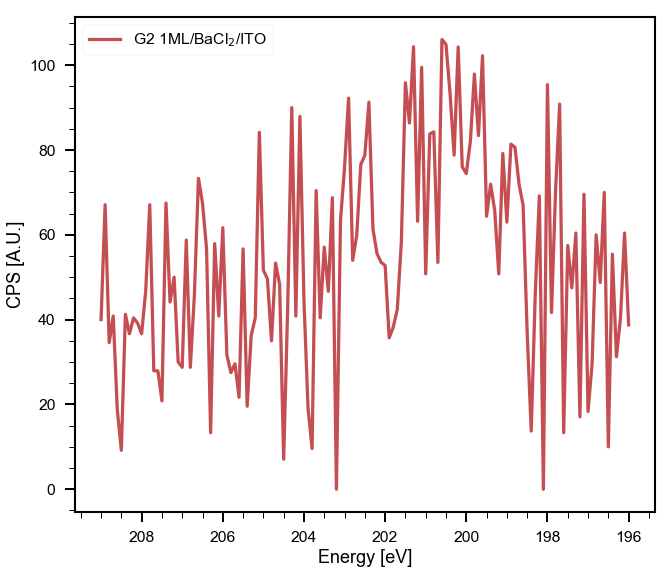

In [339]:
plot_region(g2baito[3], 'Cl2p')

In [362]:
g2baito[2].name

'BaCl$_2$ 200 ºC/ITO'

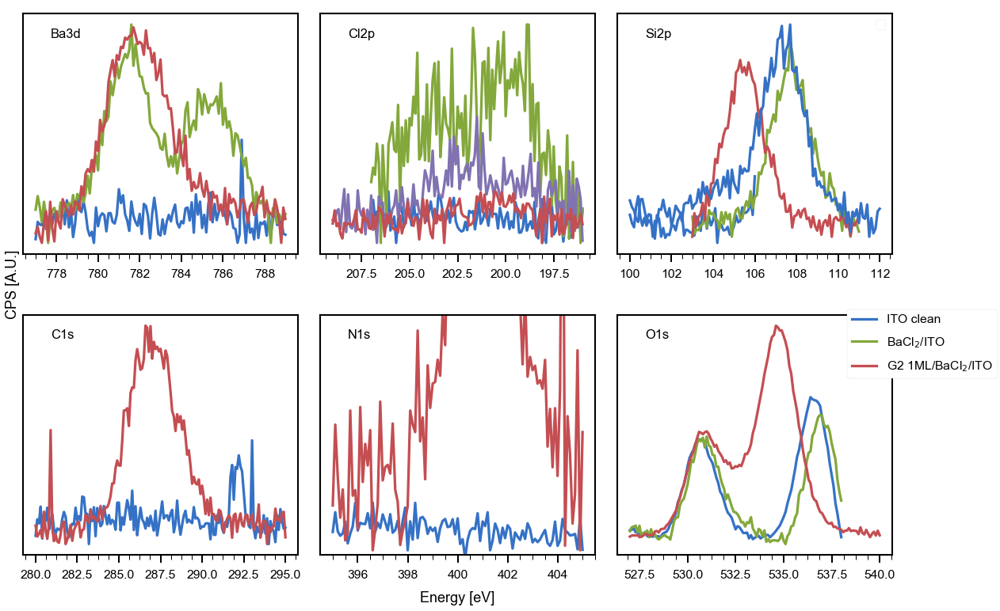

In [484]:
regs = ['Ba3d', 'Cl2p', 'Si2p', 'C1s', 'N1s', 'O1s']
ax = plot_xp_regions(g2baito, regs, ncols=3)
# ax[0,0].invert_xaxis()
# xp = g2baito[2]
# regextra = 'Ba3d(2)'
# ax[0,0].plot(xp.dfx[regextra].dropna().energy, xp.dfx[regextra].dropna().counts, 'm')

xp = g2baito[0]
regextra = 'Si2p_(2)'
ax[0,2].plot(xp.dfx[regextra].dropna().energy, xp.dfx[regextra].dropna().counts, 'b')
# ax[0,1].set(ylim=(-1, 50))

ax[1,1].set(ylim=(-1, 50))
ax[1,1].invert_xaxis()
ax[1,0].invert_xaxis()

# ax[0,0].invert_xaxis()
plt.gcf().set_figheight(12)

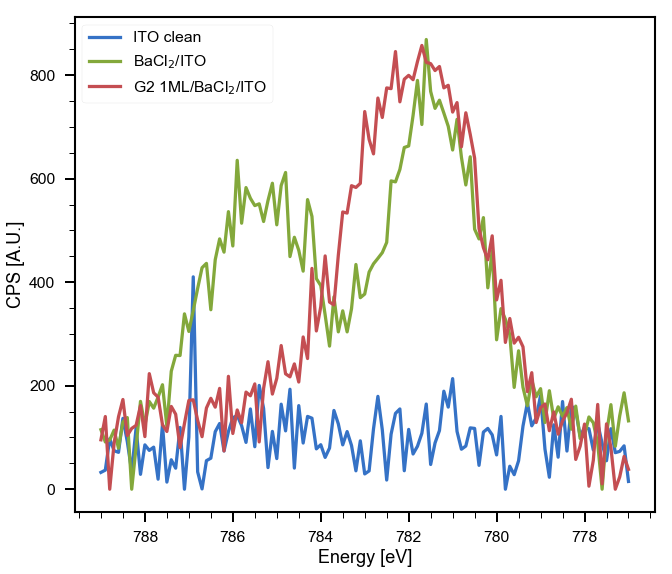

In [182]:
for xp in g2baito:
    try:
        plot_region(xp, 'Ba3d')
    except KeyError: pass

[39647.73854675859, 39725.92896063657]

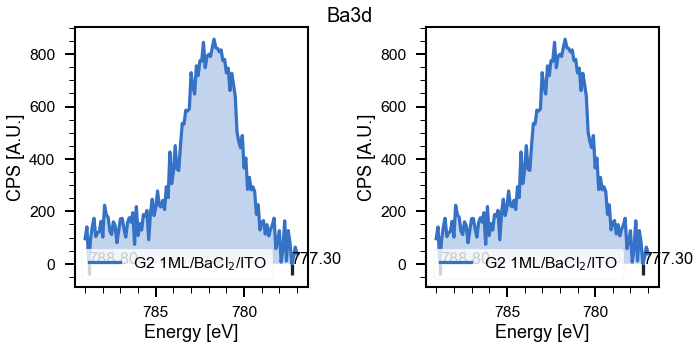

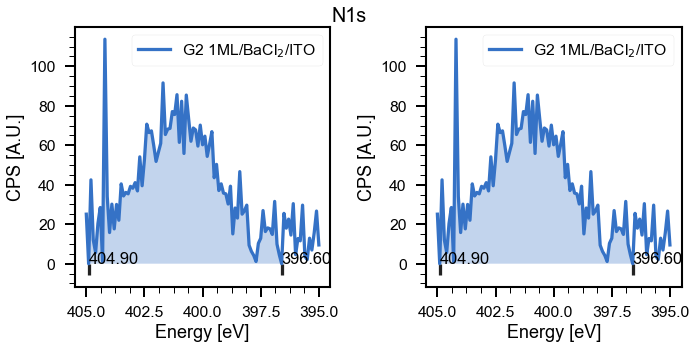

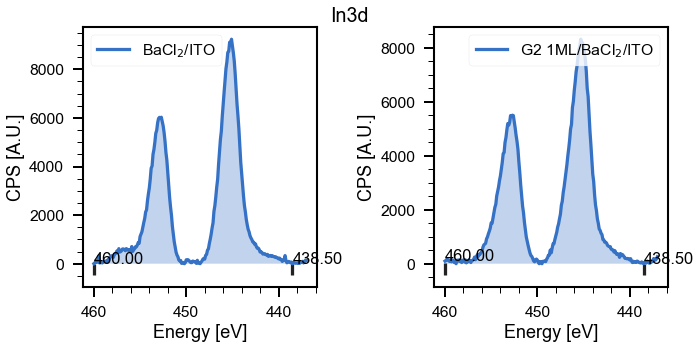

In [379]:
integrateRegions([g2baito[3], g2baito[3]], region='Ba3d', asf=asf)
integrateRegions([g2baito[3], g2baito[3]], region='N1s', asf=asf)
integrateRegions([g2baito[1], g2baito[3]], region='In3d', asf=asf)

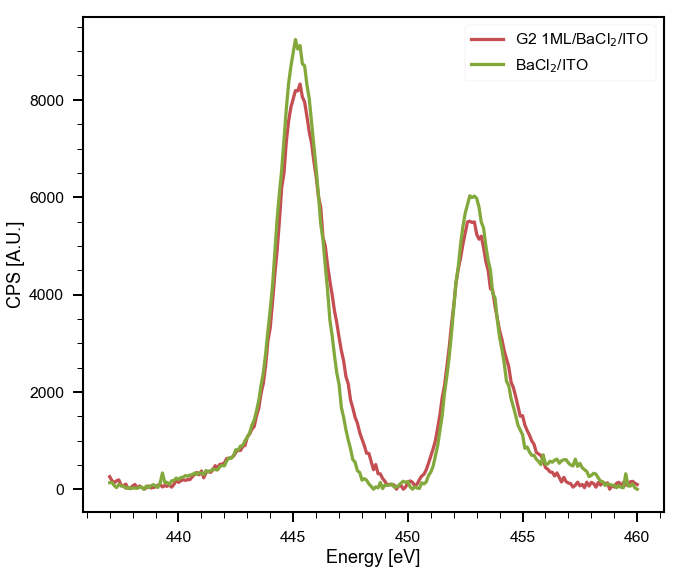

In [381]:
plot_region(g2baito[3], 'In3d')
plot_region(g2baito[1], 'In3d')

In [382]:
arrange_coverages(g2baito, inds=[[1,3]], r_ml=1.1, region='In3d', mfp=3.08, takeoff=10)

matrix([[6.63780056e-03, 9.83806338e-05]])

In [378]:
g2baito[3].area['G2'] = g2baito[3].area['N1s'] / 3
g2baito[3].area['Ba3d'] / g2baito[3].area['G2']

2.16511875978118

### BaCl2 stoichiometry

In [521]:
g2baito[2].dfx

range      Ba3d(2)              Cl2p           Cl2p_(2)            Cl2p_bg  \
properties  energy     counts energy    counts   energy     counts  energy   
0            789.0  17.291700  209.0  11.91666    209.0  838.83929   209.0   
1            788.8   0.000000  208.9  11.41666    208.8  847.85714   208.9   
2            788.6  37.739298  208.8  16.41666    208.6  831.25000   208.8   
3            788.4  15.358411  208.7  17.50000    208.4  838.48214   208.7   
4            788.2  42.659125  208.6   7.16666    208.2  842.05357   208.6   
..             ...        ...    ...       ...      ...        ...     ...   
126            NaN        NaN  196.4   6.33333      NaN        NaN   196.4   
127            NaN        NaN  196.3  33.41666      NaN        NaN   196.3   
128            NaN        NaN  196.2  29.33333      NaN        NaN   196.2   
129            NaN        NaN  196.1  22.75000      NaN        NaN   196.1   
130            NaN        NaN  196.0   1.16666      NaN        NaN   196.0   

range                 Ba3d(2)_bg               
properties     counts     energy       counts  
0           828.66667      789.0  4274.125000  
1           828.66667      788.8  4274.125000  
2           828.66667      788.6  4274.010702  
3           828.66667      788.4  4273.849889  
4           828.66667      788.2  4273.674175  
..                ...        ...          ...  
126         833.91667        NaN          NaN  
127         833.91667        NaN          NaN  
128         833.91667        NaN          NaN  
129         833.91667        NaN          NaN  
130         833.91667        NaN          NaN  

[131 rows x 10 columns]

'Ba3d(2)' region does not exist in BaCl$_2$/ITO
'Ba3d(2)' , asf missing, returning raw area


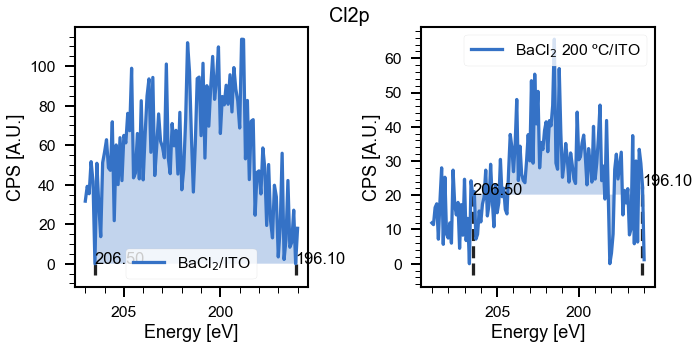

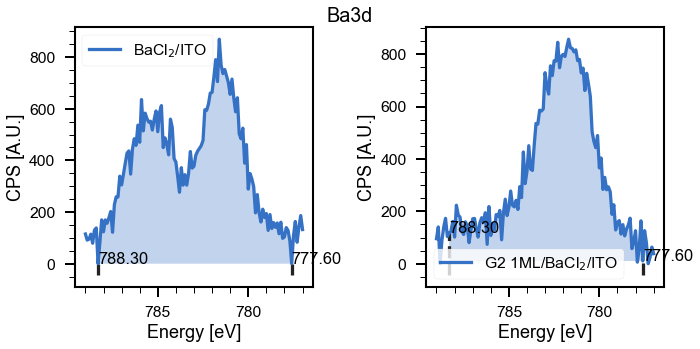

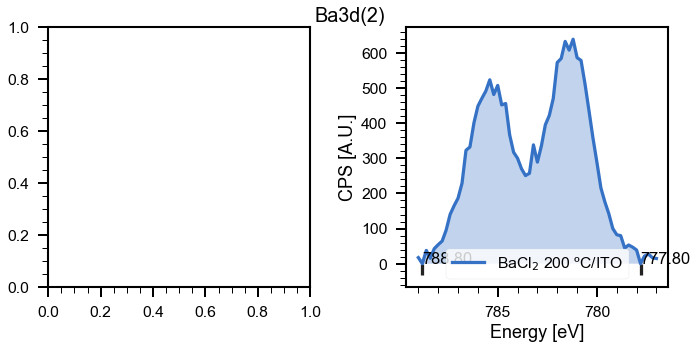

In [529]:
integrateRegions([g2baito[1], g2baito[2]], region='Cl2p', asf=asf)
integrateRegions([g2baito[1], g2baito[3]], region='Ba3d', asf=asf)
rawa = integrateRegions([g2baito[1], g2baito[2]], region='Ba3d(2)', asf=asf)

In [528]:
g2baito[1].area['Cl2p'] / g2baito[1].area['Ba3d'], g2baito[2].area['Cl2p'] / g2baito[2].area['Ba3d']

(1.2269663850178107, 0.729776459493737)

In [512]:
g2baito[3].area#['Cl2p'], g2baito[2].area['Cl2p']

{'Ba3d': 525.043347251165,
 'N1s': 727.5028377254868,
 'G2': 242.5009459084956,
 'In3d': 9113.5418583704,
 'layers': -0.006650891149205447,
 'dlayers': -9.8574653048799e-05}

### Si 2p position

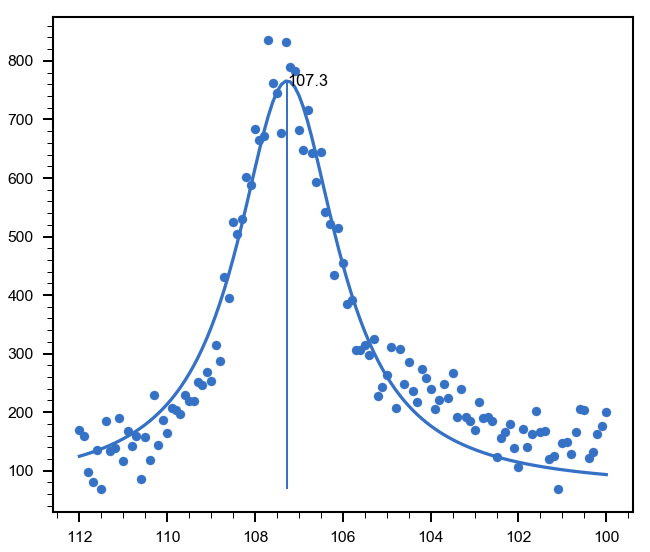

In [398]:
fn = XPFit(g2baito[0], 'Si2p_(2)')
fn.voigt()
fn.plot()

## Dev: ASF DB

In [609]:
def asfdb_read(source: str = ['Al', 'Mg']):
    path = '/Users/pabloherrero/sabat/sabatsw/xps/Scofield.csv'
    asfdb = pd.read_csv(path, sep=';')

    asfdb.index = asfdb['AtomicLevel.symbol'] + asfdb['AtomicLevel.level']
    asfdb.SensitivityFactor = asfdb.SensitivityFactor.apply(lambda x: float(x.replace(' Mb', '')))

    asfMg = asfdb.where(asfdb['ExcitationEnergy'] == '1254 eV').dropna(axis=0, how='all')
    asfAl = asfdb.where(asfdb['ExcitationEnergy'] == '1487 eV').dropna(axis=0, how='all')
    return asfAl if source == 'Mg' else asfAl

def search_asf(region):
    asdf = asfdb_read('Al')
    
    # Filter symbols in region
    regionf = region.replace('_', '')
    m = re.search(r"\([0-9]\)", regionf)
    try:
        regionf = regionf.replace(m.group(), '')
    except AttributeError: pass
    
    try:
        val_Scofield = asdf.loc[regionf].SensitivityFactor
        val_powTanum = asdf.loc[regionf].SensitivityFactor / asdf.loc['F1s'].SensitivityFactor
        return {region : val_powTanum}
    except KeyError:
        print(regionf, " region not found in database")

In [675]:
search_asf('Ba3d_5/2')

{'Ba3d_5/2': 5.832957110609481}

In [671]:
region = 'Ba3d_5/2(2)'
region = region.replace('_', '')
m = re.search(r"\([0-9]\)", region).group()
region = region.replace(m, '')
asfAl.loc[region].SensitivityFactor / asfAl.loc['F1s'].SensitivityFactor

5.832957110609481

In [670]:
asf['Ba3d']

7.49

In [601]:
asfAl.loc['Ba3d5/2'].SensitivityFactor / asfAl.loc['C1s'].SensitivityFactor

25.840000000000003

In [602]:
def integrateRegions(exps: list, region : str,  asf: dict = None, indRef: int= None,
                     eup: float = None, edw: float = None,
                     lb : str = None, flag_fill : bool = True):
    """Integrate peaks for a list of experiments between two minima
       The minima are automatically located for exps[indRef] unless they are specified by eup and edw
    The boundary are fixed for the whole list."""

    if indRef == None: indRef = guess_xpRef(exps, region)

    xRef = exps[indRef].dfx[region].dropna().energy     # Use the energy array of reference xp to crop the other xp's

    if eup == None or edw == None:
        ind = flexible_integration_limits(exps[indRef], region=region, doublePeak=0, flag_plot=False)
        lmidx, rmidx = ind[-2:] # The index of the minima are always the last two
        eup, edw = xRef[lmidx], xRef[rmidx]

    fig, ax = plt.subplots(1, len(exps), figsize=(len(exps)*5, 5) )
    area = []
    for i, xp in enumerate(exps):
        try:
            y = xp.dfx[region].dropna().counts
        except KeyError as e:          #Check the region exists in this xp
            print(e, 'region does not exist in ' + xp.name)
            xp.area.update({region: 1e-10})
            continue

        x = xp.dfx[region].dropna().energy
        ax[i].plot(x, y, label=xp.name)

        xpCrop = crop_spectrum(xp, region, eup = eup, edw = edw)
        yc = xpCrop.dfx[region].dropna().counts.values
        xc = xpCrop.dfx[region].dropna().energy.values    # Integrate only in the cropped range

        step = x[0] - x[1]
        area.append(np.trapz(yc, dx=step))

        if asf == None:
            asf = search_asf(region)
        try:
            xp.area.update({region : area[-1]/asf[region]})
        except (KeyError, NameError) as e:
            print(e, ', asf missing, returning raw area')
            pass

        #### Plotting the operation

        if flag_fill:
            if yc[0] > yc[-1]:
                ax[i].fill_between(xc , y1 = yc[-1], y2 = yc, alpha=0.3)
            else:
                ax[i].fill_between(xc, y1 = yc[0], y2 = yc, alpha=0.3)
            ybase = ax[i].get_ylim()[0]

            for j in [0, -1]:
                ax[i].vlines(xc[j], ymin=ybase, ymax=yc[j], linestyles='--')
                ax[i].text(s='%.2f'%xc[j], x = xc[j], y = yc[j])
        cosmetics_plot(ax=ax[i])
    plt.tight_layout()
    fig.suptitle(region)
    return area


## Absorption G2 (solution)

In [742]:
pathabs  = '/Users/pabloherrero/sabat/LabFBIp/data/fluorimeter/absorption/G2_absorption.csv'
dfabs = pd.read_csv(pathabs, sep=';')
dfabs.rename({'Unnamed: 0' : '$\lambda$ (nm)'}, inplace=True, axis=1)
dfabs.set_index('$\lambda$ (nm)', drop=True, inplace=True)

In [743]:
dfabs

,G2_ACN_1E-4,G2_1E-4_1XBa
$\lambda$ (nm),,
800,0.088500,0.000297
799,0.000114,0.000336
798,0.006960,0.000399
797,0.006430,0.000434
796,0.000125,0.000374
...,...,...
204,3.549328,3.191540
203,3.596608,3.210922
202,3.643181,3.221707


In [740]:
dfabs.columns

Index(['G2_ACN_1E-4', 'G2_1E-4_1XBa'], dtype='object')

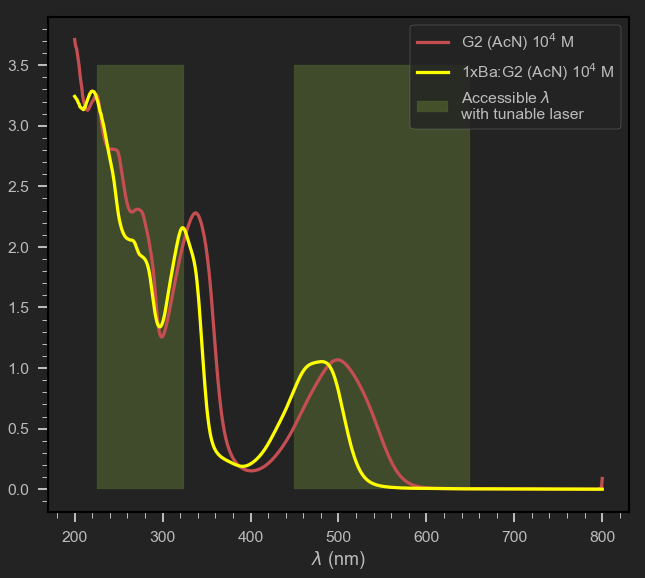

In [793]:
jtplot.style('monokai', context='talk', grid=False, ticks=True, fscale=1.5)

dfabs['G2_ACN_1E-4'].plot(color='r', label='G2 (AcN) 10$^4$ M')
dfabs['G2_1E-4_1XBa'].plot(color='yellow', label='1xBa:G2 (AcN) 10$^4$ M')
laser2pa0 = np.arange(450, 650)/2
laser2pa1 =np.arange(900, 1300)/2
plt.fill_between(x=laser2pa0, y1=0, y2=3.5, color='g', alpha=0.3)
plt.fill_between(x=laser2pa1, y1=0, y2=3.5, color='g', alpha=0.3,
                 label='Accessible $\lambda$ \nwith tunable laser')
plt.legend()


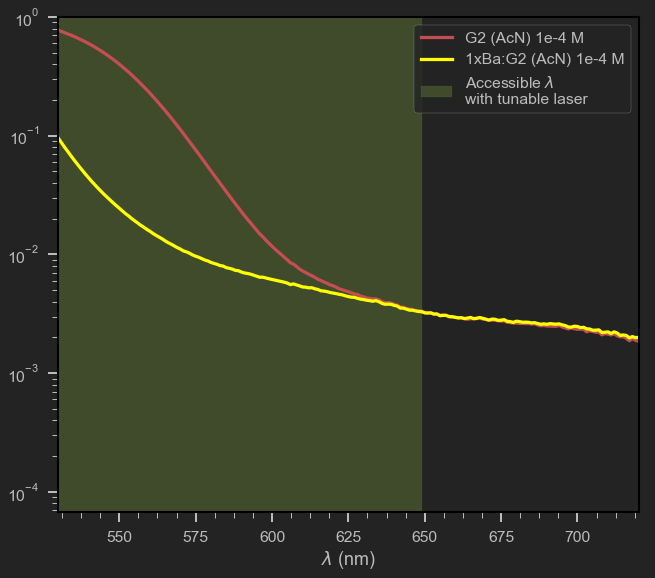

In [792]:
dfabs['G2_ACN_1E-4'].plot(color='r', label='G2 (AcN) 1e-4 M')
dfabs['G2_1E-4_1XBa'].plot(color='yellow', label='1xBa:G2 (AcN) 1e-4 M')
plt.yscale('log')
plt.gca().set(xlim=(530,720), ylim=(-0.1, 1))
laser1pa = np.arange(450, 650)
plt.fill_between(x=laser1pa, y1=0, y2=3.5, color='g', alpha=0.3,
                 label='Accessible $\lambda$ \nwith tunable laser')
plt.legend()        
# jtplot.style('grade3', context='talk', grid=False, ticks=True, fscale=1.5)


In [756]:
dfabs['G2_ACN_1E-4'].loc[:300].argmax(), dfabs['G2_1E-4_1XBa'].loc[:300].argmax()

(462, 477)

In [807]:
xC = 17
xH = 39
xN = 1
xO = 3
xSi = 1
xtot = xC+xH+xN+xO+xSi
xC/xtot, xH/xtot, xN/xtot, xO/xtot

(0.2786885245901639,
 0.639344262295082,
 0.01639344262295082,
 0.04918032786885246)